# Time series analysis from Kaggle Notebook
https://www.kaggle.com/code/kashnitsky/topic-9-part-1-time-series-analysis-in-python

In [1]:
import warnings                                  # `do not disturbe` mode
warnings.filterwarnings('ignore')

import numpy as np                               # vectors and matrices
import pandas as pd                              # tables and data manipulations
import matplotlib.pyplot as plt                  # plots
import seaborn as sns                            # more plots

from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization

import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product                    # some useful functions
from tqdm import tqdm



%matplotlib inline



In [2]:
# Load Timestamp of Dataset
path = "C:/Users/ChiaraVogt/Desktop/Masterarbeit/DatenLigue180/"
#d2014 = pd.read_csv(path + "ligue180-2014.csv", encoding='utf-8-sig', delimiter=';', usecols=['data_atendimento'])
#d2015 = pd.read_csv(path + "ligue180-2015.csv", encoding='utf-8-sig', delimiter=';', usecols=['data_atendimento'])
#d2016 = pd.read_csv(path + "ligue180-2016.csv", encoding='utf-8-sig', delimiter=';', usecols=['data_atendimento'])
#d2017 = pd.read_csv(path + "ligue180-2017.csv", encoding='utf-8-sig', delimiter=';', usecols=['data_atendimento'])
#d2018 = pd.read_csv(path + "ligue180-2018.csv", encoding='utf-8-sig', delimiter=';', usecols=['data_atendimento'])
#d2018_2 = pd.read_csv(path + "ligue180-nov-2018.csv", encoding='utf-8-sig', delimiter=';', usecols=['data_atendimento'])
#d2019 = pd.read_csv(path + "ligue180-2019.csv", encoding='utf-8-sig', delimiter=';', usecols=['data_atendimento'])
#d2020 = pd.read_csv(path + "ligue180-primeiro-semestre-2020.csv", encoding='utf-8-sig', delimiter=';', usecols=['Data_da_denúncia'])
d2020_2 = pd.read_csv(path + "ligue180-segundo-semestre-2020.csv", encoding='utf-8-sig', delimiter=';', usecols=['Data de cadastro'])
d2021 = pd.read_csv(path + "ligue180-primeiro-semestre-2021.csv", encoding='utf-8-sig', delimiter=';', usecols=['Data de cadastro'])
d2021_2 = pd.read_csv(path + "ligue180-segundo-semestre-2021.csv", encoding='utf-8-sig', delimiter=';', usecols=['Data de cadastro'])
d2022 = pd.read_csv(path + "ligue180-primeiro-semestre-2022.csv", encoding='utf-8-sig', delimiter=';', usecols=['Data de cadastro'])
d2022_2 = pd.read_csv(path + "ligue180-segundo-semestre-2022.csv", encoding='utf-8-sig', delimiter=';', usecols=['Data_de_cadastro'])
d2023 = pd.read_csv(path + "ligue180-primeiro-semestre-2023.csv", encoding='utf-8-sig', delimiter=';', usecols=['Data_de_cadastro'])
d2023_2 = pd.read_csv(path + "ligue180-segundo-semestre-2023.csv", encoding='utf-8-sig', delimiter=';', usecols=['Data_de_cadastro'])

In [3]:
# Timestamp angleichen
#d2014['data_atendimento'] = pd.to_datetime(d2014['data_atendimento'], dayfirst = True)
#d2015['data_atendimento'] = pd.to_datetime(d2015['data_atendimento'])
#d2016['data_atendimento'] = pd.to_datetime(d2016['data_atendimento'], dayfirst = True)
#d2017['data_atendimento'] = pd.to_datetime(d2017['data_atendimento'])
#d2018['data_atendimento'] = pd.to_datetime(d2018['data_atendimento'])
#d2018_2['data_atendimento'] = pd.to_datetime(d2018_2['data_atendimento'])
#d2019['data_atendimento'] = pd.to_datetime(d2019['data_atendimento'])
#d2020['Data_da_denúncia'] = pd.to_datetime(d2020['Data_da_denúncia'], dayfirst = True)
d2020_2['Data de cadastro'] = pd.to_datetime(d2020_2['Data de cadastro'], dayfirst = True)
d2021['Data de cadastro'] = pd.to_datetime(d2021['Data de cadastro'], dayfirst = True)
d2021_2['Data de cadastro'] = pd.to_datetime(d2021_2['Data de cadastro'], dayfirst = True)
d2022['Data de cadastro'] = pd.to_datetime(d2022['Data de cadastro'], dayfirst = True)
d2022_2['Data_de_cadastro'] = pd.to_datetime(d2022_2['Data_de_cadastro'], dayfirst = True)
d2023['Data_de_cadastro'] = pd.to_datetime(d2023['Data_de_cadastro'], dayfirst = True)
d2023_2['Data_de_cadastro'] = pd.to_datetime(d2023_2['Data_de_cadastro'], dayfirst = True)

In [4]:
# Spaltennamen angleichen
#d2014 = d2014.rename(columns = {'data_atendimento' : 'date'})
#d2015 = d2015.rename(columns = {'data_atendimento' : 'date'})
#d2016 = d2016.rename(columns = {'data_atendimento' : 'date'})
#d2017 = d2017.rename(columns = {'data_atendimento' : 'date'})
#d2018 = d2018.rename(columns = {'data_atendimento' : 'date'})
#d2018_2 = d2018_2.rename(columns = {'data_atendimento' : 'date'})
#d2019 = d2019.rename(columns = {'data_atendimento' : 'date'})
#d2020 = d2020.rename(columns = {'Data_da_denúncia' : 'date'})
d2020_2 = d2020_2.rename(columns = {'Data de cadastro' : 'date'})
d2021 = d2021.rename(columns = {'Data de cadastro' : 'date'})
d2021_2 = d2021_2.rename(columns = {'Data de cadastro' : 'date'})
d2022 = d2022.rename(columns = {'Data de cadastro' : 'date'})
d2022_2 = d2022_2.rename(columns = {'Data_de_cadastro' : 'date'})
d2023 = d2023.rename(columns = {'Data_de_cadastro' : 'date'})
d2023_2 = d2023_2.rename(columns = {'Data_de_cadastro' : 'date'})

In [5]:
d2021['date']

0        2021-01-12 12:29:00
1        2021-01-09 17:07:00
2        2021-01-01 09:45:00
3        2021-01-14 15:07:00
4        2021-01-08 23:56:00
                 ...        
193165   2021-06-27 16:59:00
193166   2021-06-19 11:12:00
193167   2021-06-28 17:57:00
193168   2021-06-24 17:58:00
193169   2021-06-17 14:28:00
Name: date, Length: 193170, dtype: datetime64[ns]

In [6]:
# Zeitreihen zu Datensatz verbinden
#data_atend_all = pd.concat([d2014, d2015, d2016, d2017, d2018, d2018_2, d2019, d2020, d2020_2, d2021, d2021_2, d2022, d2022_2, d2023, d2023_2], ignore_index= True)
data_atend_all = pd.concat([d2020_2, d2021, d2021_2, d2022, d2022_2, d2023, d2023_2], ignore_index= True)
data_atend_all

,date
0,2020-07-02 14:18:00.000
1,2020-07-03 20:14:00.000
2,2020-07-15 19:31:00.000
3,2020-07-15 14:21:00.000
4,2020-07-07 17:41:00.000
...,...
1681149,2023-10-18 21:22:34.883
1681150,2023-09-27 08:20:05.077
1681151,2023-07-01 10:31:44.750
1681152,2023-12-07 16:19:23.747


In [7]:
data_atend_all

,date
0,2020-07-02 14:18:00.000
1,2020-07-03 20:14:00.000
2,2020-07-15 19:31:00.000
3,2020-07-15 14:21:00.000
4,2020-07-07 17:41:00.000
...,...
1681149,2023-10-18 21:22:34.883
1681150,2023-09-27 08:20:05.077
1681151,2023-07-01 10:31:44.750
1681152,2023-12-07 16:19:23.747


In [8]:
data_atend_all.set_index('date', inplace=True)
df_hourly = data_atend_all.resample('H').size().reset_index(name='calls')
df_hourly.set_index('date', inplace=True)

df_hourly

,calls
date,
2020-07-01 00:00:00,1
2020-07-01 01:00:00,5
2020-07-01 02:00:00,6
2020-07-01 03:00:00,2
2020-07-01 04:00:00,1
...,...
2023-12-31 19:00:00,98
2023-12-31 20:00:00,84
2023-12-31 21:00:00,68


In [9]:
df_daily = data_atend_all.resample('D').size().reset_index(name='calls')
df_daily.set_index('date', inplace=True)

df_daily

,calls
date,
2020-07-01,282
2020-07-02,381
2020-07-03,359
2020-07-04,454
2020-07-05,372
...,...
2023-12-27,2160
2023-12-28,1992
2023-12-29,1957


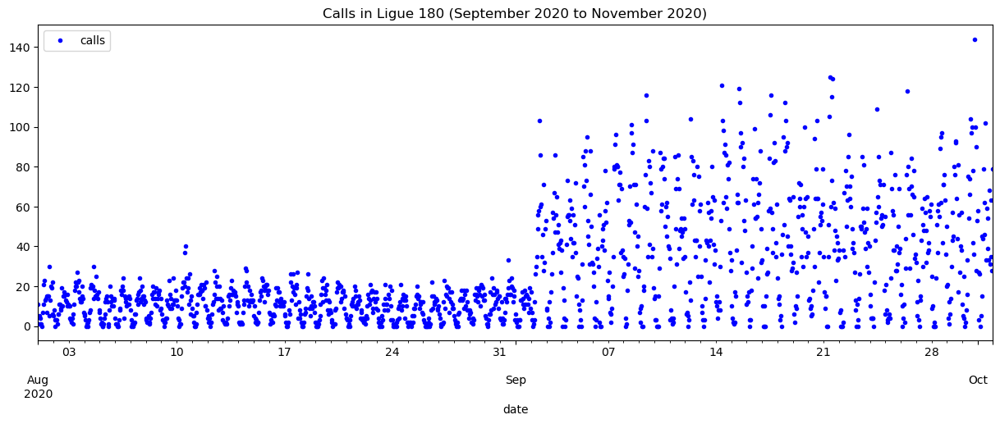

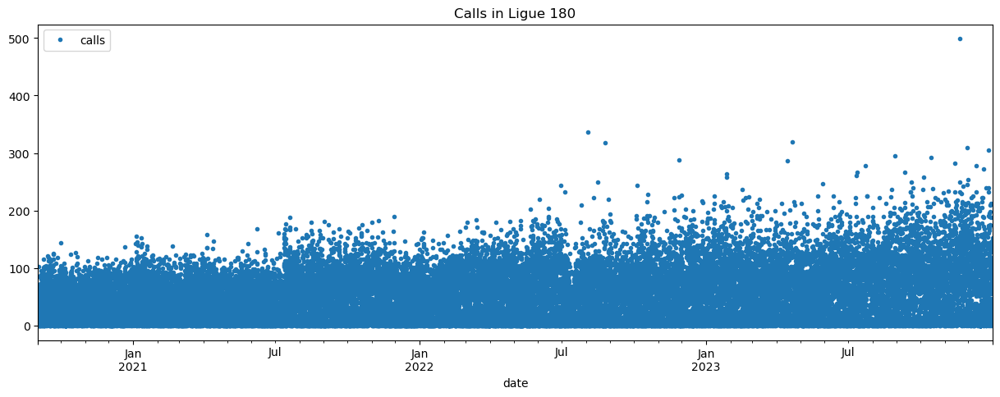

In [11]:
# Filtere den DataFrame für die gewünschte Zeitspanne
df_filtered = df_hourly.loc['2020-08-01':'2020-10-01']

# Plot der gefilterten Daten
df_filtered.plot(style='.', figsize=(15,5), color='blue', title='Calls in Ligue 180 (September 2020 to November 2020)')
plt.show()

df_hourly = df_hourly.loc['2020-09-02':]

df_hourly.plot(style='.', figsize=(15,5), title='Calls in Ligue 180')
plt.show()

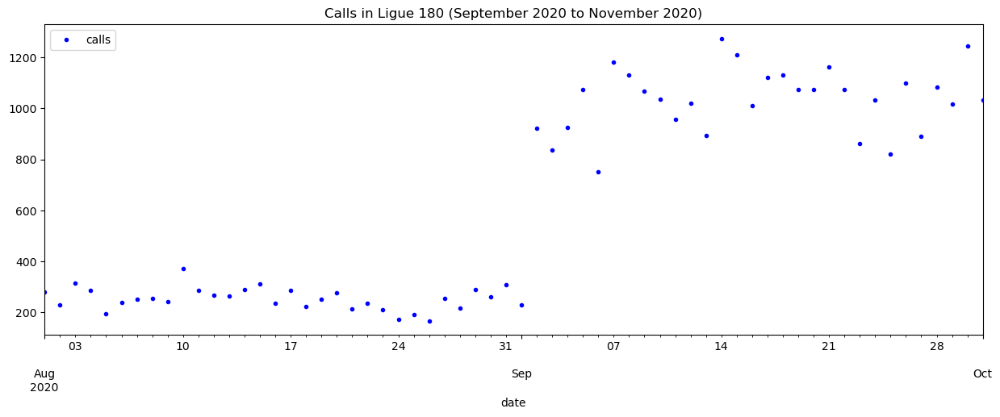

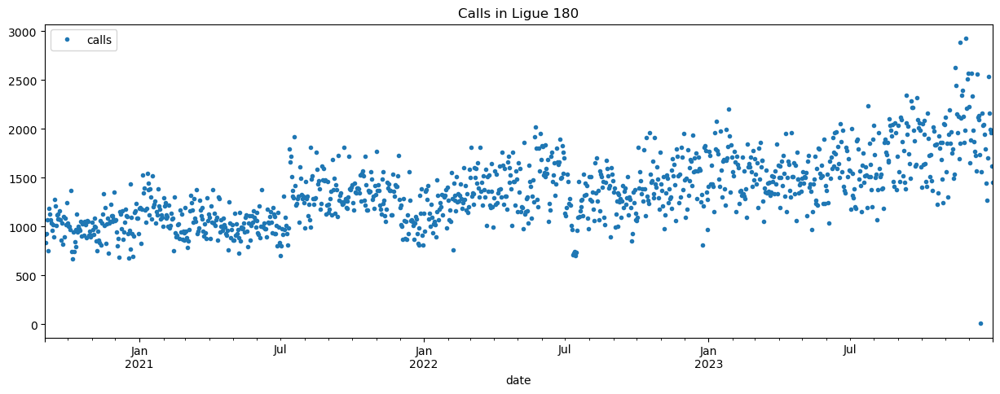

In [12]:
# Filtere den DataFrame für die gewünschte Zeitspanne
df_filtered = df_daily.loc['2020-08-01':'2020-10-01']

# Plot der gefilterten Daten
df_filtered.plot(style='.', figsize=(15,5), color='blue', title='Calls in Ligue 180 (September 2020 to November 2020)')
plt.show()

df_daily = df_daily.loc['2020-09-02':]

df_daily.plot(style='.', figsize=(15,5), title='Calls in Ligue 180')
plt.show()

In [13]:
df_daily_null_values_count = df_daily['calls'].isnull().sum()
df_hourly_null_values_count = df_daily['calls'].isnull().sum()

print(f"Anzahl der Nullwerte in der Spalte 'calls': {df_daily_null_values_count}, {df_hourly_null_values_count}")

Anzahl der Nullwerte in der Spalte 'calls': 0, 0


In [14]:
data_atend_all.to_csv('data_atend_all.csv', index=True)
df_daily.to_csv('df_daily.csv', index=True)
df_hourly.to_csv('df_hourly.csv', index=True)

## Time series analysis in Python
Analyse aus: https://www.kaggle.com/code/kashnitsky/topic-9-part-1-time-series-analysis-in-python/notebook 25.07.24, 10:56

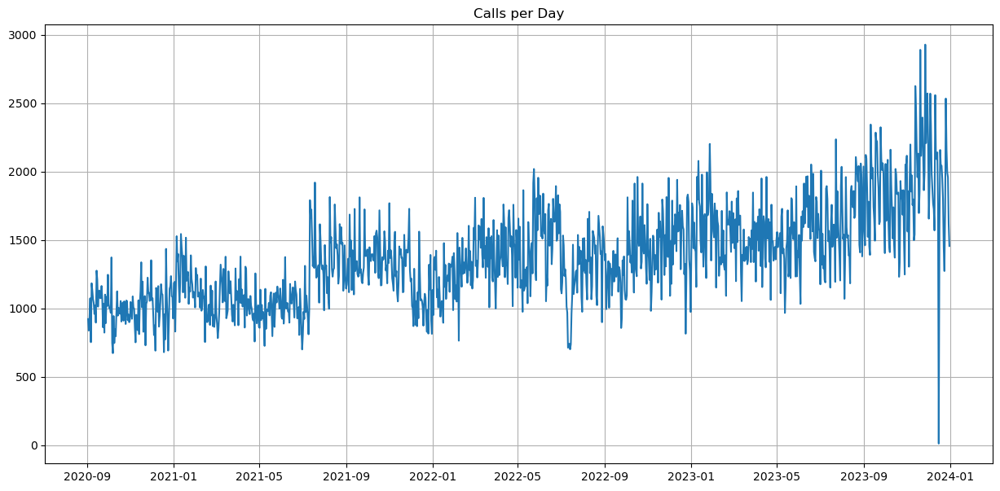

In [15]:
plt.figure(figsize=(15, 7))
plt.plot(df_daily.calls)
plt.title('Calls per Day')
plt.grid(True)
plt.show()

### Forecast quality metrics

In [16]:
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

## Moving, Smoothing and Evaluation
### Berechnung des Gleitenden Mittelwertes


In [17]:
# Berechnung des Gleitenden Mittelwertes
def moving_average(series, n):
    """
        Calculate average of last n observations
    """
    return np.average(series[-n:])

moving_average(df_daily, 7) # Berechnung des Mittelswertes der letzten sieben Tage

1917.0

In [18]:
def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):
    """
        series - dataframe with timeseries
        window - rolling window size 
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(15, 5))
    plt.title("Moving average\n window size = {}".format(window))
    
    # Plot actual values first to keep them in the background
    plt.plot(series, label="Actual values")

    # Plot rolling mean trend
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")
        
        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index)
            anomalies[series < lower_bond] = series[series < lower_bond]
            anomalies[series > upper_bond] = series[series > upper_bond]
            plt.plot(anomalies, "ro", markersize=10)
        
    plt.legend(loc="upper left")
    plt.grid(True)
    plt.show()

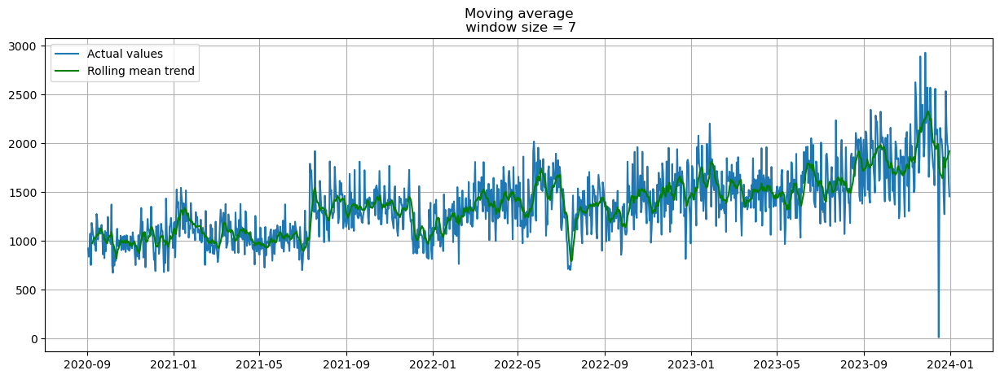

In [19]:
plotMovingAverage (df_daily, 7)

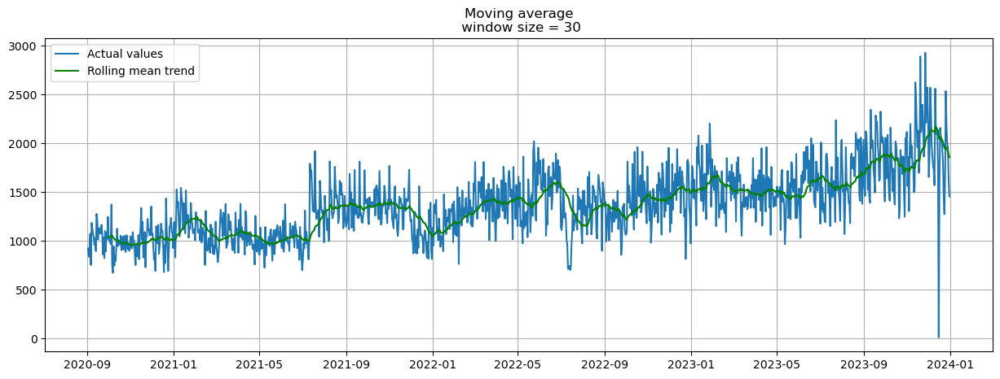

In [20]:
plotMovingAverage (df_daily, 30)

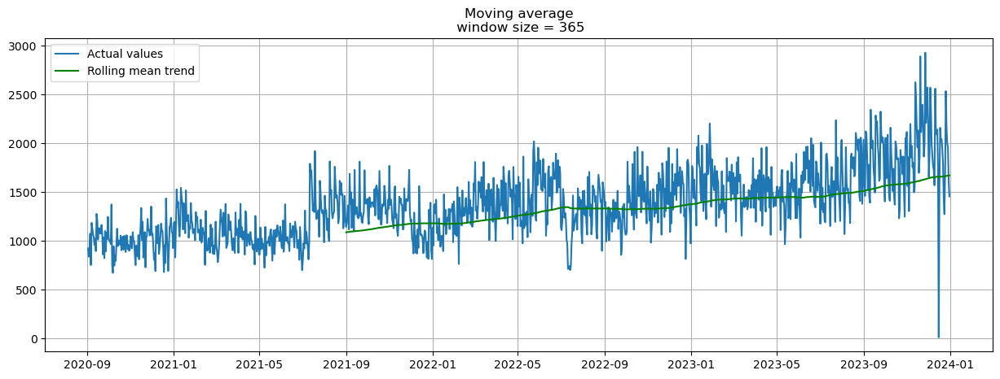

In [21]:
plotMovingAverage (df_daily, 365) 

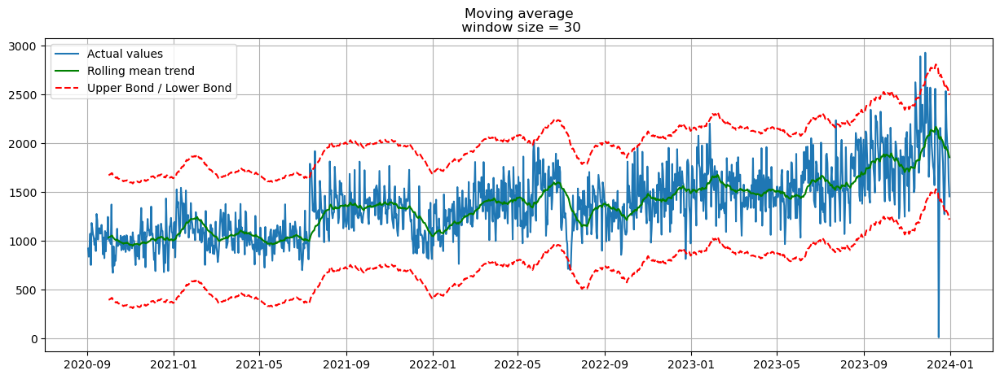

In [22]:
plotMovingAverage(df_daily, 30, plot_intervals=True, plot_anomalies= True)

### Gewichteter Durchschnitt

In [23]:
def weighted_average(series, weights):
    """
        Calculate weighted average on the series.
        Assuming weights are sorted in descending order
        (larger weights are assigned to more recent observations).
    """
    result = 0.0
    for n in range(len(weights)):
        result += series.iloc[-n-1] * weights[n]
    return float(result)

In [24]:
weighted_average(df_daily, [0.6, 0.3, 0.1])

1553.5

### Exponentielle Glättung

In [25]:
def exponential_smoothing(series, alpha):
    """
        series - dataset with timestamps
        alpha - float [0.0, 1.0], smoothing parameter
    """
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

In [26]:
def plotExponentialSmoothing(series, alphas):
    """
        Plots exponential smoothing with different alphas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters
        
    """
    with plt.style.context('seaborn-v0_8-white'):    
        plt.figure(figsize=(15, 7))
        plt.plot(series.values, "c", label = "Actual")
        for alpha in alphas:
            plt.plot(exponential_smoothing(series, alpha), label="Alpha {}".format(alpha))
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Exponential Smoothing")
        plt.grid(True);

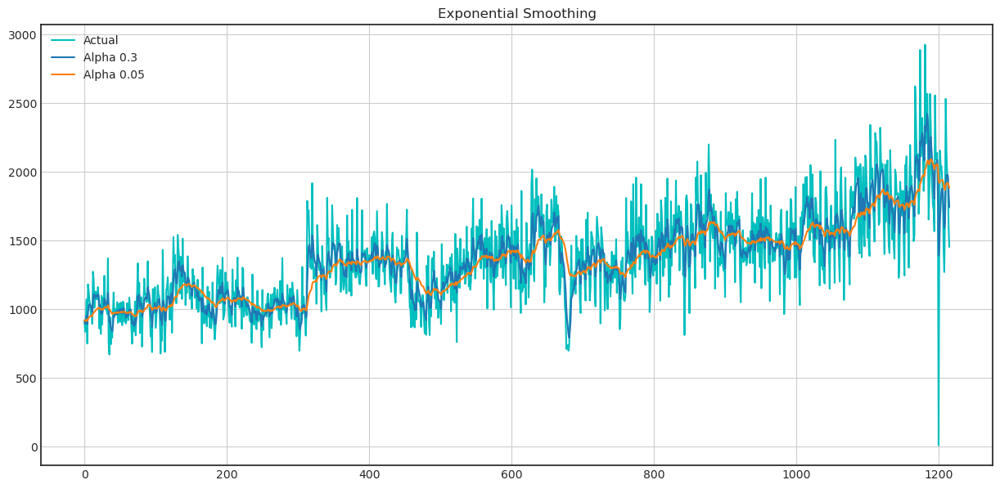

In [27]:
plotExponentialSmoothing(df_daily.calls, [0.3, 0.05])

Alpha ist der Glättungs-Faktor. Je kleiner alpha ist, desto mehr Einfluss haben die vorherigen Ereignisse im Vergleich zum momentanen Ereignis.


## Double exponential smoothing


In [28]:
def double_exponential_smoothing(series, alpha, beta):
    """
        series - dataset with timeseries
        alpha - float [0.0, 1.0], smoothing parameter for level
        beta - float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series)+1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series): # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
    return result

def plotDoubleExponentialSmoothing(series, alphas, betas):
    """
        Plots double exponential smoothing with different alphas and betas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters for level
        betas - list of floats, smoothing parameters for trend
    """
    
    with plt.style.context('seaborn-v0_8-white'):    
        plt.figure(figsize=(20, 8))
        plt.plot(series.values, label = "Actual")
        for alpha in alphas:
            for beta in betas:
                plt.plot(double_exponential_smoothing(series, alpha, beta), label="Alpha {}, beta {}".format(alpha, beta))
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Double Exponential Smoothing")
        plt.grid(True)

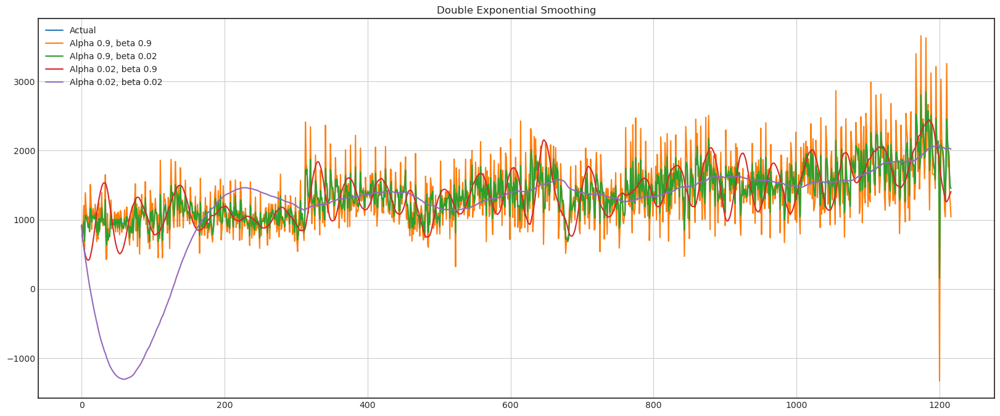

In [29]:
plotDoubleExponentialSmoothing(df_daily.calls, alphas=[0.9, 0.02], betas=[0.9, 0.02])

Die doppelte Exponentielle Glättung beinhaltet die Komponenten Level und Trend. 

### Triple Exponential Smoothing aka Holt-Winters

Dieses Verfahren berücksichtigt nicht nur Level und Trend, sondern auch Season/Saison.

In [30]:
class HoltWinters:
    """
    Holt-Winters model with the anomalies detection using Brutlag method
    
    # series - initial time series
    # slen - length of a season
    # alpha, beta, gamma - Holt-Winters model coefficients
    # n_preds - predictions horizon
    # scaling_factor - sets the width of the confidence interval by Brutlag (usually takes values from 2 to 3)
    """
    
    def __init__(self, series, slen, alpha, beta, gamma, n_preds, scaling_factor=1.96):
        self.series = series
        self.slen = slen
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.n_preds = n_preds
        self.scaling_factor = scaling_factor
        
    def initial_trend(self):
        sum = 0.0
        for i in range(self.slen):
            sum += float(self.series[i+self.slen] - self.series[i]) / self.slen
        return sum / self.slen  
    
    def initial_seasonal_components(self):
        seasonals = {}
        season_averages = []
        n_seasons = int(len(self.series)/self.slen)
        # let's calculate season averages
        for j in range(n_seasons):
            season_averages.append(sum(self.series[self.slen*j:self.slen*j+self.slen])/float(self.slen))
        # let's calculate initial values
        for i in range(self.slen):
            sum_of_vals_over_avg = 0.0
            for j in range(n_seasons):
                sum_of_vals_over_avg += self.series[self.slen*j+i]-season_averages[j]
            seasonals[i] = sum_of_vals_over_avg/n_seasons
        return seasonals   
      
    def triple_exponential_smoothing(self):
        self.result = []
        self.Smooth = []
        self.Season = []
        self.Trend = []
        self.PredictedDeviation = []
        self.UpperBond = []
        self.LowerBond = []
        
        seasonals = self.initial_seasonal_components()
        
        for i in range(len(self.series)+self.n_preds):
            if i == 0: # components initialization
                smooth = self.series[0]
                trend = self.initial_trend()
                self.result.append(self.series[0])
                self.Smooth.append(smooth)
                self.Trend.append(trend)
                self.Season.append(seasonals[i%self.slen])
                
                self.PredictedDeviation.append(0)
                
                self.UpperBond.append(self.result[0] + 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                
                self.LowerBond.append(self.result[0] - 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                continue
                
            if i >= len(self.series): # predicting
                m = i - len(self.series) + 1
                self.result.append((smooth + m*trend) + seasonals[i%self.slen])
                
                # when predicting we increase uncertainty on each step
                self.PredictedDeviation.append(self.PredictedDeviation[-1]*1.01) 
                
            else:
                val = self.series[i]
                last_smooth, smooth = smooth, self.alpha*(val-seasonals[i%self.slen]) + (1-self.alpha)*(smooth+trend)
                trend = self.beta * (smooth-last_smooth) + (1-self.beta)*trend
                seasonals[i%self.slen] = self.gamma*(val-smooth) + (1-self.gamma)*seasonals[i%self.slen]
                self.result.append(smooth+trend+seasonals[i%self.slen])
                
                # Deviation is calculated according to Brutlag algorithm.
                self.PredictedDeviation.append(self.gamma * np.abs(self.series[i] - self.result[i]) 
                                               + (1-self.gamma)*self.PredictedDeviation[-1])
                     
            self.UpperBond.append(self.result[-1] + 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.LowerBond.append(self.result[-1] - 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.Smooth.append(smooth)
            self.Trend.append(trend)
            self.Season.append(seasonals[i%self.slen])

### Time Series Cross Validation

In [31]:
from sklearn.model_selection import TimeSeriesSplit # you have everything done for you

def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=24):
    """
        Returns error on CV  
        
        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []
    
    values = series.values
    alpha, beta, gamma = params
    
    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=3) 
    
    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):
        model = HoltWinters(series=values[train], slen=slen, 
                            alpha=alpha, beta=beta, gamma=gamma, n_preds=len(test))
        model.triple_exponential_smoothing()
        
        predictions = model.result[-len(test):]
        actual = values[test]
        error = loss_function(actual, predictions)
        errors.append(error)
        
    return np.mean(np.array(errors))

In [32]:
%%time
data = df_daily.calls[:-20] # leave some data for testing

# initializing model parameters alpha, beta and gamma
x = [0, 0, 0] 

# Minimizing the loss function
opt = minimize(timeseriesCVscore, x0=x, 
               args=(data, mean_squared_log_error), 
               method="TNC", bounds = ((0, 1), (0, 1), (0, 1))
              )

# Take optimal values...
alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

# ...and train the model with them, forecasting for the next 50 hours
model = HoltWinters(data, slen = 24, 
                    alpha = alpha_final, 
                    beta = beta_final, 
                    gamma = gamma_final, 
                    n_preds = 50, scaling_factor = 3)
model.triple_exponential_smoothing()

ValueError: Mean Squared Logarithmic Error cannot be used when targets contain negative values.

In [33]:
from sklearn.metrics import mean_squared_error
from scipy.optimize import minimize
import numpy as np
import pandas as pd

# Check for negative values
negative_values = df_daily.calls[df_daily.calls < 0]
print(f"Negative values in calls: {negative_values}")

if len(negative_values) > 0:
    raise ValueError("The data contains negative values, which is not suitable for mean_squared_log_error.")

def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=24):
    """
        Returns error on CV  
        
        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []
    
    values = series.values
    alpha, beta, gamma = params
    
    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=3) 
    
    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):
        model = HoltWinters(series=values[train], slen=slen, 
                            alpha=alpha, beta=beta, gamma=gamma, n_preds=len(test))
        model.triple_exponential_smoothing()
        
        predictions = model.result[-len(test):]
        actual = values[test]
        error = loss_function(actual, predictions)
        errors.append(error)
        
    return np.mean(np.array(errors))

data = df_daily.calls[:-20]  # Belassen Sie einige Daten zum Testen

# Initialisieren Sie die Modellparameter alpha, beta und gamma
x = [0, 0, 0] 

# Minimieren Sie die Verlustfunktion
opt = minimize(timeseriesCVscore, x0=x, 
               args=(data, mean_squared_error), 
               method="TNC", bounds = ((0, 1), (0, 1), (0, 1))
              )

# Nehmen Sie die optimalen Werte...
alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

# ...und trainieren Sie das Modell mit ihnen, indem Sie die nächsten 50 Stunden vorhersagen
model = HoltWinters(data, slen = 24, 
                    alpha = alpha_final, 
                    beta = beta_final, 
                    gamma = gamma_final, 
                    n_preds = 50, scaling_factor = 3)
model.triple_exponential_smoothing()

Negative values in calls: Series([], Name: calls, dtype: int64)
0.00565724032019993 0.01969071706533282 0.0009000998634782209


In [34]:
def plotHoltWinters(series, plot_intervals=False, plot_anomalies=False):
    """
        series - dataset with timeseries
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """
    
    plt.figure(figsize=(20, 10))
    plt.plot(series.values, label = "Actual")
    plt.plot(model.result, label = "Model")
    error = mean_absolute_percentage_error(series.values, model.result[:len(series)])
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    
    if plot_anomalies:
        anomalies = np.array([np.NaN]*len(series))
        anomalies[series.values<model.LowerBond[:len(series)]] = \
            series.values[series.values<model.LowerBond[:len(series)]]
        anomalies[series.values>model.UpperBond[:len(series)]] = \
            series.values[series.values>model.UpperBond[:len(series)]]
        plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    if plot_intervals:
        plt.plot(model.UpperBond, "r--", alpha=0.5, label = "Up/Low confidence")
        plt.plot(model.LowerBond, "r--", alpha=0.5)
        plt.fill_between(x=range(0,len(model.result)), y1=model.UpperBond, 
                         y2=model.LowerBond, alpha=0.2, color = "grey")    
        
    plt.vlines(len(series), ymin=min(model.LowerBond), ymax=max(model.UpperBond), linestyles='dashed')
    plt.axvspan(len(series)-20, len(model.result), alpha=0.3, color='lightgrey')
    plt.grid(True)
    plt.axis('tight')
    plt.legend(loc="best", fontsize=13);

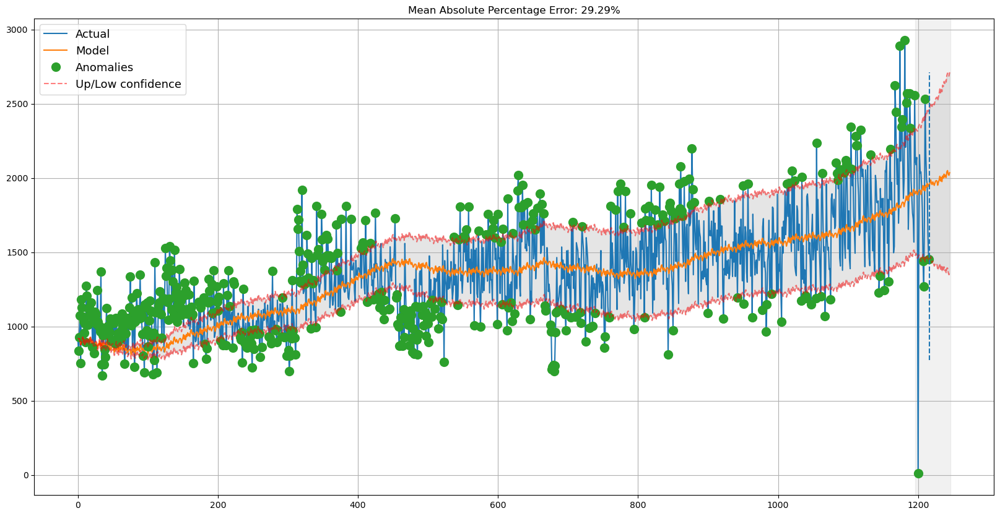

In [35]:
plotHoltWinters(df_daily.calls, plot_intervals=True, plot_anomalies=True)

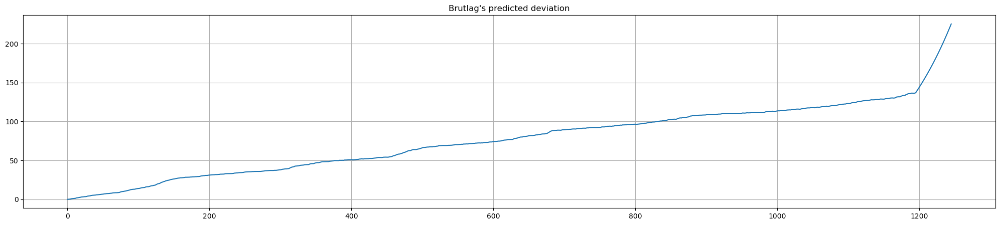

In [36]:
plt.figure(figsize=(25, 5))
plt.plot(model.PredictedDeviation)
plt.grid(True)
plt.axis('tight')
plt.title("Brutlag's predicted deviation");

## Econometric approach

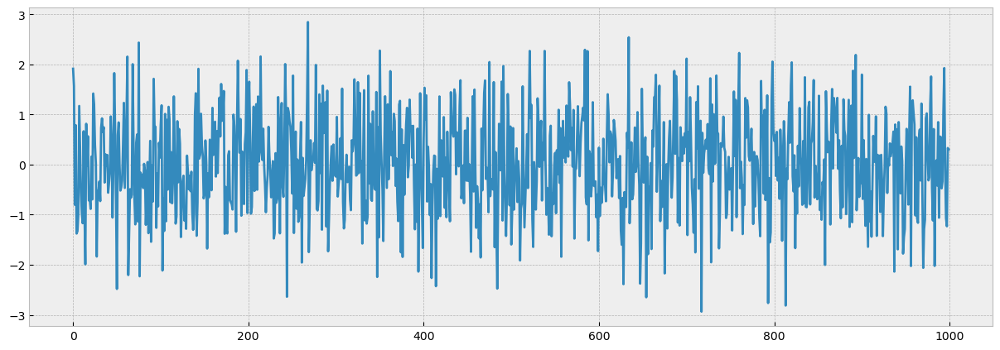

In [37]:
white_noise = np.random.normal(size=1000)
with plt.style.context('bmh'):  
    plt.figure(figsize=(15, 5))
    plt.plot(white_noise)

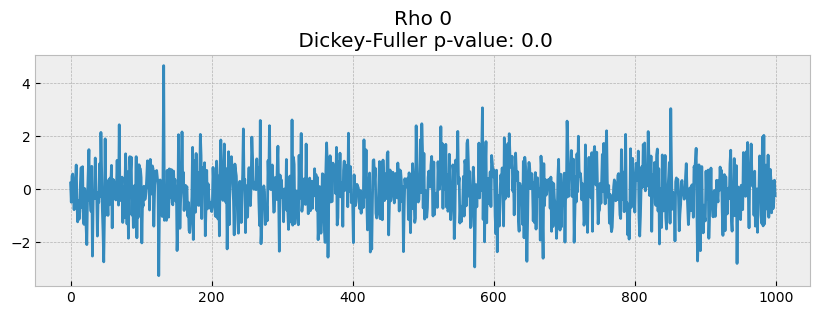

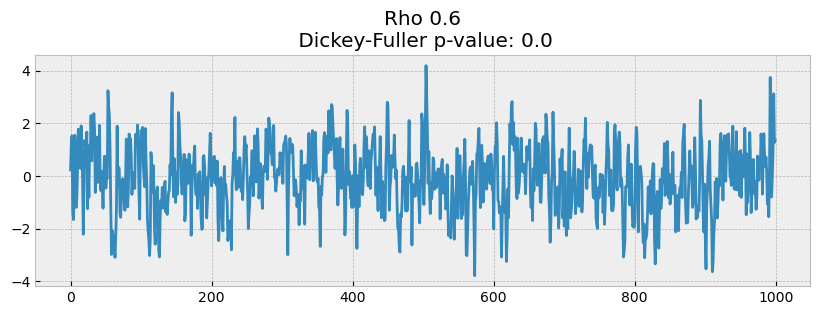

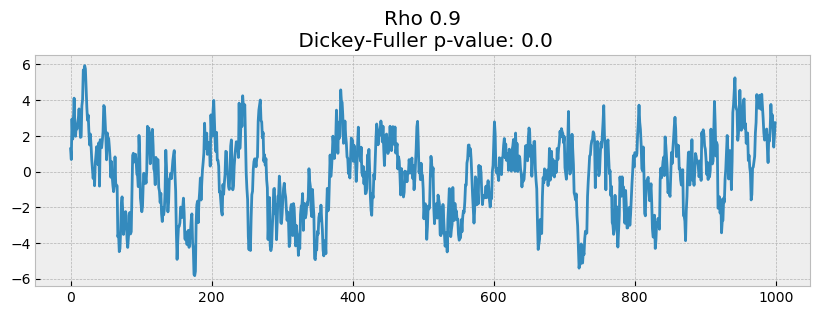

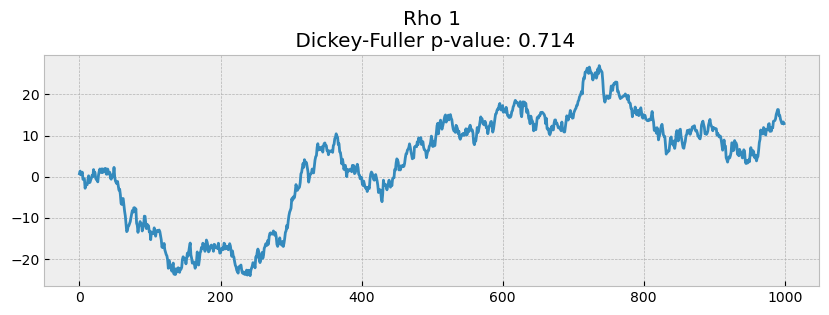

In [38]:
def plotProcess(n_samples=1000, rho=0):
    x = w = np.random.normal(size=n_samples)
    for t in range(n_samples):
        x[t] = rho * x[t-1] + w[t]

    with plt.style.context('bmh'):  
        plt.figure(figsize=(10, 3))
        plt.plot(x)
        plt.title("Rho {}\n Dickey-Fuller p-value: {}".format(rho, round(sm.tsa.stattools.adfuller(x)[1], 3)))
        
for rho in [0, 0.6, 0.9, 1]:
    plotProcess(rho=rho)

### Getting rid of non-stationarity and building SARIMA

In [39]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    """
        Plot time series, its ACF (Autorcorrelation Function) and PACF (Partial Autocorrelation Function), calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

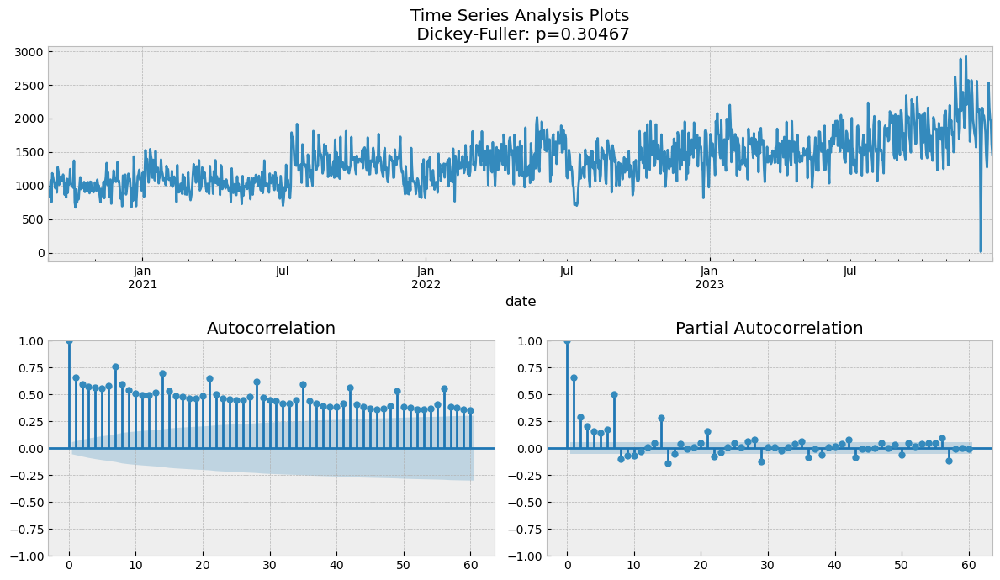

In [40]:
tsplot(df_daily.calls, lags=60)

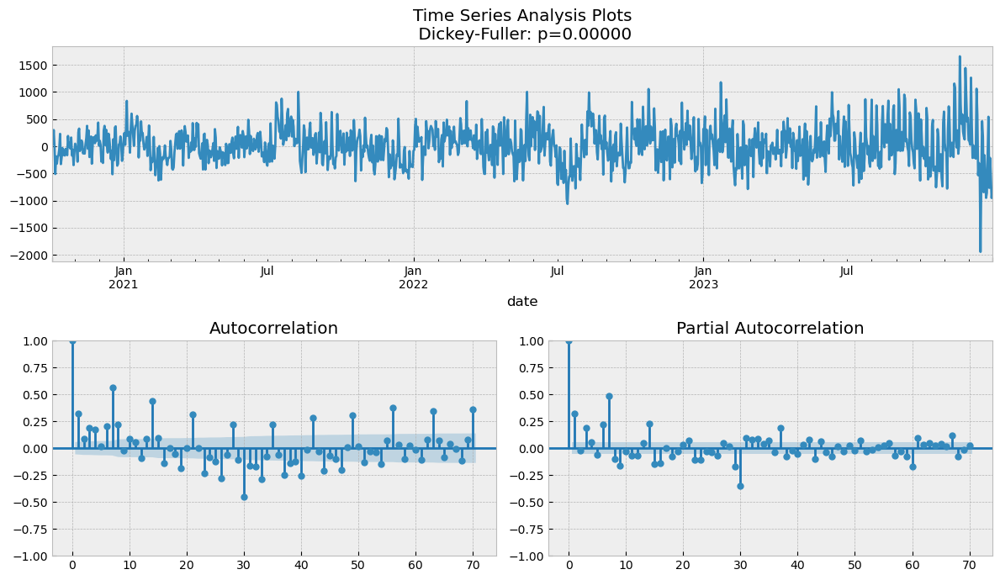

In [41]:
df_diff = df_daily.calls - df_daily.calls.shift(30) # shift: um dreißig Tage versetzte Werte
tsplot(df_diff[30+1:], lags=70)

## ARIMA-Family Crashcourse

***AR(p)*** Regression der Zeitreihe auf sich selbst.  
Grundannahme: aktuelle Werte hängen mit gewisser Verzögerung von früheren Werten ab.  
Maximale Verzögerung ist *p*, um das erste zu finden müssen wir in der PACF die größte signifikante Veränderung finden nach der die meisten anderen unbedeutend werden.  
  
***MA(q)*** Modell des gleitenden Durchschnitts - Modellierung des Fehlers in der Zeitreihe.  
Grundannahme: aktueller Fehler vom verherigen mit gewisser Verzögerung abhängig.  
Maximal Verzögerung des Fehlers ist *q*, kann ebenfalls damit gefunden werden, das der erste signifikante Werte, aber in ACF bestimmt wird.  
  
***I(d)*** Integrationsordnung. Anzahl der nicht saisonalen Differenzen für eine stationäre Reihe.  
Kann 1 oder 0 sein, je nachdem ob Saisonalität angewandt wurde oder nicht.  
  
***S(s)*** Saisonalität. Länge der Saisonperiode der Reihe.  
  
***P***  
  
***Q***  
  
***D***  



--------

***p*** wahrscheinlich **7**, da danach die Punkte weniger signifikant sind  
***d*** ist **1**, da es saisonale Unterschiede gibt  
***q*** auch hier könnte es **7** sein, da die folgenden Datenpunkte weniger signifikant sind  


In [42]:
ps = range(2, 5)
d=1 
qs = range(2, 5)
Ps = range(0, 2)
D=1 
Qs = range(0, 2)
s = 24 # season length is still 24

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

36

In [43]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
    Return dataframe with parameters and corresponding AIC
    
    parameters_list - list with (p, q, P, Q) tuples
    d - integration order in ARIMA model
    D - seasonal integration order 
    s - length of season
    """
    
    results = []
    best_aic = float("inf")

    for param in tqdm(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model = sm.tsa.statespace.SARIMAX(df_daily.calls, 
                                              order=(param[0], d, param[1]), 
                                              seasonal_order=(param[2], D, param[3], s)).fit(disp=False)
        except Exception as e:
            print(f"Exception for parameters {param}: {e}")
            continue
        
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results, columns=['parameters', 'aic'])
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table


In [44]:
%%time
result_table = optimizeSARIMA(parameters_list, d, D, s)

  0%|          | 0/36 [00:00<?, ?it/s]c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
  3%|▎         | 1/36 [00:04<02:40,  4.59s/it]c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\base\model.

CPU times: total: 28min 36s
Wall time: 18min 53s


In [45]:
result_table.head()

,parameters,aic
0,"(4, 3, 1, 1)",16255.627832
1,"(4, 3, 0, 1)",16405.006600
2,"(4, 2, 1, 1)",16422.320746
3,"(2, 2, 1, 1)",16432.302682
4,"(3, 2, 1, 1)",16433.537990


In [46]:
p, q, P, Q = result_table.parameters[0]

best_model=sm.tsa.statespace.SARIMAX(df_daily.calls, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(best_model.summary())

c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\ChiaraVogt\miniconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                      SARIMAX Results                                       
Dep. Variable:                                calls   No. Observations:                 1216
Model:             SARIMAX(4, 1, 3)x(1, 1, [1], 24)   Log Likelihood               -8117.814
Date:                              Fri, 16 Aug 2024   AIC                          16255.628
Time:                                      10:25:55   BIC                          16306.453
Sample:                                  09-02-2020   HQIC                         16274.781
                                       - 12-31-2023                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9596      0.052     18.538      0.000       0.858       1.061
ar.L2         -0.73

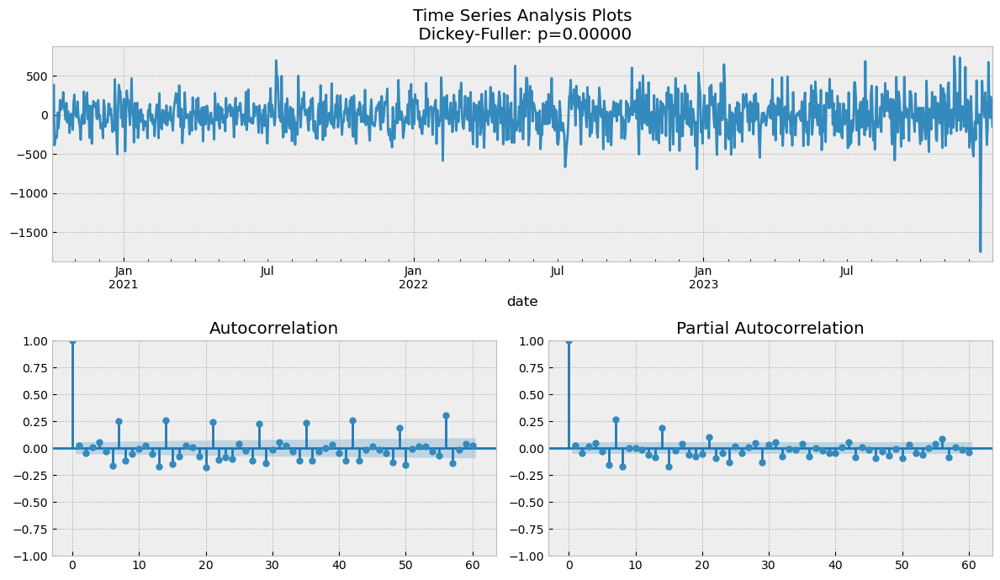

In [47]:
tsplot(best_model.resid[30+1:], lags=60)

In [48]:
def plotSARIMA(series, model, n_steps):
    """
    Plots model vs predicted values
    
    series - dataset with timeseries
    model - fitted SARIMA model
    n_steps - number of steps to predict in the future
    s - length of season
    d - integration order in ARIMA model
    """
    # adding model values
    data = series.copy()
    data.columns = ['actual']
    data['arima_model'] = model.fittedvalues
    
    # making a shift on s+d steps, because these values were unobserved by the model due to the differentiating
    data['arima_model'] = data['arima_model'].shift(s + d)
    
    # forecasting on n_steps forward 
    forecast = model.get_forecast(steps=n_steps).predicted_mean
    forecast_index = pd.date_range(start=data.index[-1], periods=n_steps + 1, freq='D')[1:]
    forecast = pd.Series(forecast, index=forecast_index)
    forecast = pd.concat([data['arima_model'], forecast])
    
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(data['actual'][s + d:], data['arima_model'][s + d:])

    plt.figure(figsize=(100, 5))
    plt.title(f"Mean Absolute Percentage Error: {error:.2f}%")
    plt.plot(data['actual'], label="actual")
    plt.plot(forecast, color='r', label="model")
    plt.axvspan(data.index[-1], forecast.index[-1], alpha=0.5, color='lightgrey')
    plt.legend()
    plt.grid(True)
    plt.show()


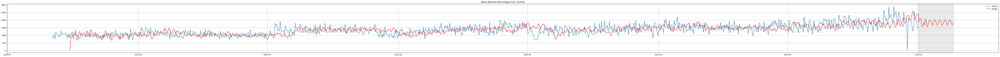

In [49]:
plotSARIMA(df_daily, best_model, 50)

# Random Forest Prediction

In [50]:
# Creating a copy of the initial datagrame to make various transformations 
data = pd.DataFrame(df_daily.calls.copy())
data.columns = ["y"]

In [51]:
# Adding the lag of the target variable from 6 steps back up to 24
for i in range(6, 31):
    data["lag_{}".format(i)] = data.y.shift(i)

In [52]:
# take a look at the new dataframe 
data.tail(7)

,y,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,...,lag_21,lag_22,lag_23,lag_24,lag_25,lag_26,lag_27,lag_28,lag_29,lag_30
date,,,,,,,,,,,,,,,,,,,,,
2023-12-25,1706,2034.0,2157.0,1561.0,11.0,1738.0,2139.0,2090.0,2116.0,2558.0,...,2569.0,1885.0,1655.0,2227.0,2570.0,2507.0,2207.0,2927.0,1989.0,1863.0
2023-12-26,2533,2042.0,2034.0,2157.0,1561.0,11.0,1738.0,2139.0,2090.0,2116.0,...,2336.0,2569.0,1885.0,1655.0,2227.0,2570.0,2507.0,2207.0,2927.0,1989.0
2023-12-27,2160,1947.0,2042.0,2034.0,2157.0,1561.0,11.0,1738.0,2139.0,2090.0,...,1982.0,2336.0,2569.0,1885.0,1655.0,2227.0,2570.0,2507.0,2207.0,2927.0
2023-12-28,1992,1797.0,1947.0,2042.0,2034.0,2157.0,1561.0,11.0,1738.0,2139.0,...,1869.0,1982.0,2336.0,2569.0,1885.0,1655.0,2227.0,2570.0,2507.0,2207.0
2023-12-29,1957,1443.0,1797.0,1947.0,2042.0,2034.0,2157.0,1561.0,11.0,1738.0,...,1765.0,1869.0,1982.0,2336.0,2569.0,1885.0,1655.0,2227.0,2570.0,2507.0
2023-12-30,1616,1272.0,1443.0,1797.0,1947.0,2042.0,2034.0,2157.0,1561.0,11.0,...,1724.0,1765.0,1869.0,1982.0,2336.0,2569.0,1885.0,1655.0,2227.0,2570.0
2023-12-31,1455,1706.0,1272.0,1443.0,1797.0,1947.0,2042.0,2034.0,2157.0,1561.0,...,1569.0,1724.0,1765.0,1869.0,1982.0,2336.0,2569.0,1885.0,1655.0,2227.0


In [53]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

# for time-series cross-validation set 5 folds 
tscv = TimeSeriesSplit(n_splits=5)

In [54]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

In [55]:
y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

# reserve 30% of data for testing
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [56]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [57]:
def plotModelResults(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=tscv, 
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);
    
def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

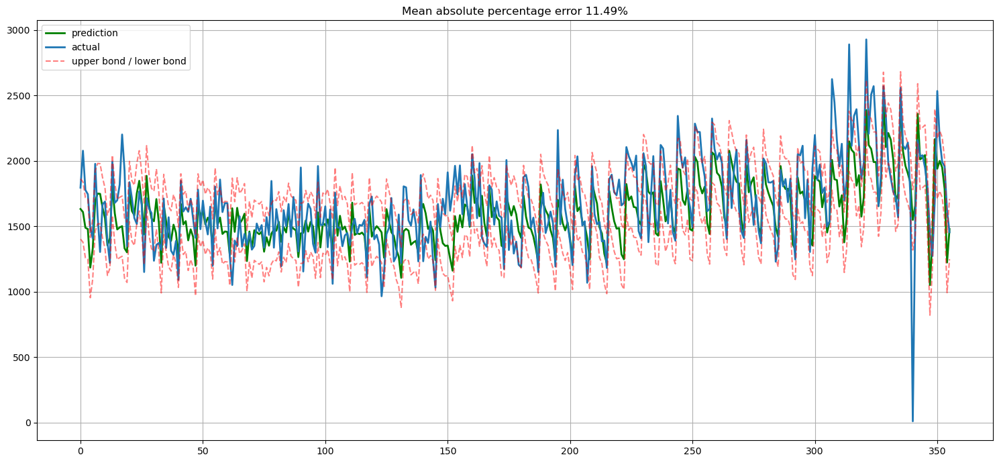

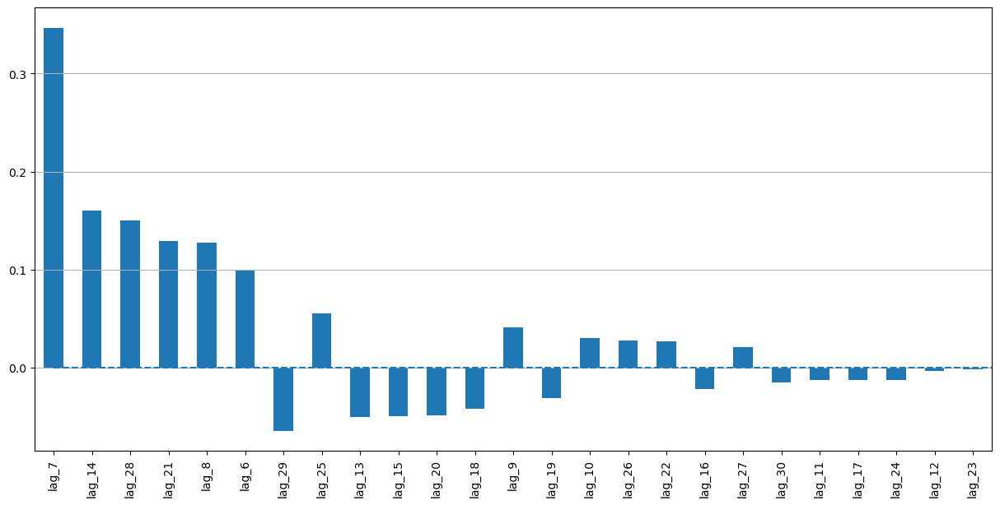

In [58]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

In [59]:
data.index = pd.to_datetime(data.index)
data["hour"] = data.index.hour
data["weekday"] = data.index.weekday
data['is_weekend'] = data.weekday.isin([5,6])*1
data.tail()

,y,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,...,lag_24,lag_25,lag_26,lag_27,lag_28,lag_29,lag_30,hour,weekday,is_weekend
date,,,,,,,,,,,,,,,,,,,,,
2023-12-27,2160,1947.0,2042.0,2034.0,2157.0,1561.0,11.0,1738.0,2139.0,2090.0,...,1885.0,1655.0,2227.0,2570.0,2507.0,2207.0,2927.0,0,2,0
2023-12-28,1992,1797.0,1947.0,2042.0,2034.0,2157.0,1561.0,11.0,1738.0,2139.0,...,2569.0,1885.0,1655.0,2227.0,2570.0,2507.0,2207.0,0,3,0
2023-12-29,1957,1443.0,1797.0,1947.0,2042.0,2034.0,2157.0,1561.0,11.0,1738.0,...,2336.0,2569.0,1885.0,1655.0,2227.0,2570.0,2507.0,0,4,0
2023-12-30,1616,1272.0,1443.0,1797.0,1947.0,2042.0,2034.0,2157.0,1561.0,11.0,...,1982.0,2336.0,2569.0,1885.0,1655.0,2227.0,2570.0,0,5,1
2023-12-31,1455,1706.0,1272.0,1443.0,1797.0,1947.0,2042.0,2034.0,2157.0,1561.0,...,1869.0,1982.0,2336.0,2569.0,1885.0,1655.0,2227.0,0,6,1


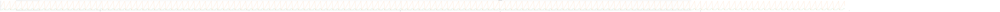

In [60]:
plt.figure(figsize=(500, 5))
plt.title("Encoded features")
data.hour.plot()
data.weekday.plot()
data.is_weekend.plot()
plt.grid(True);

In [61]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

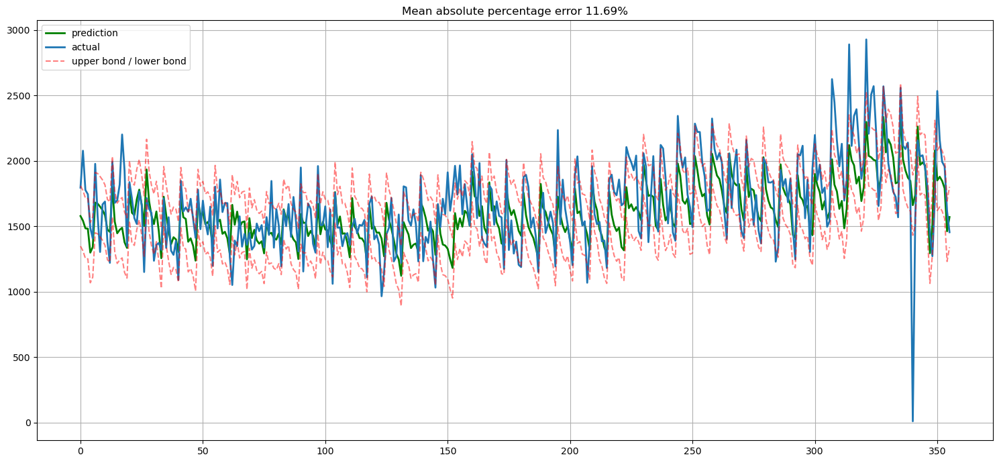

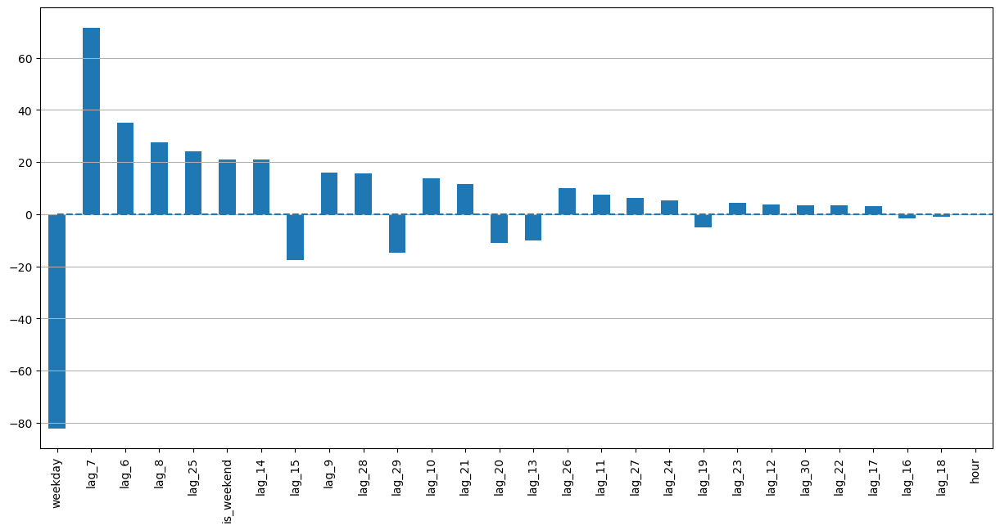

In [62]:
y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True)
plotCoefficients(lr)

In [63]:
def code_mean(data, cat_feature, real_feature):
    """
    Returns a dictionary where keys are unique categories of the cat_feature,
    and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

In [64]:
average_weekday = code_mean(data, 'weekday', "y")

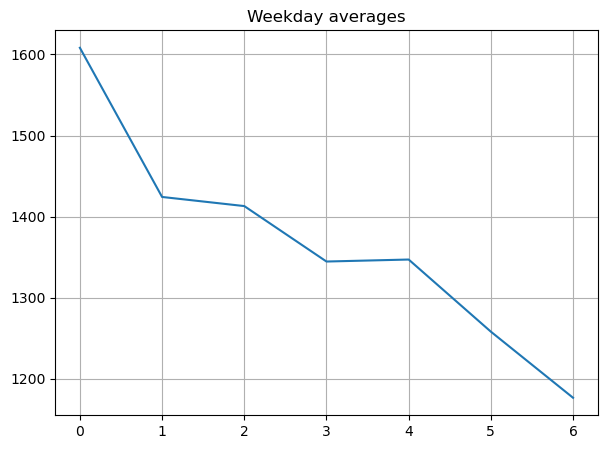

In [65]:
average_weekday = code_mean(data, 'weekday', "y")
plt.figure(figsize=(7, 5))
plt.title("Weekday averages")
pd.DataFrame.from_dict(average_weekday, orient='index')[0].plot()
plt.grid(True);

In [66]:
def prepareData(series, lag_start, lag_end, test_size, target_encoding=False):
    """
        series: pd.DataFrame
            dataframe with timeseries

        lag_start: int
            initial step back in time to slice target variable 
            example - lag_start = 1 means that the model 
                      will see yesterday's values to predict today

        lag_end: int
            final step back in time to slice target variable
            example - lag_end = 4 means that the model 
                      will see up to 4 days back in time to predict today

        test_size: float
            size of the test dataset after train/test split as percentage of dataset

        target_encoding: boolean
            if True - add target averages to the dataset
        
    """
    
    # copy of the initial dataset
    data = pd.DataFrame(series.copy())
    data.columns = ["y"]
    
    # lags of series
    for i in range(lag_start, lag_end):
        data["lag_{}".format(i)] = data.y.shift(i)
    
    # datetime features
    data.index = pd.to_datetime(data.index)
    data["weekday"] = data.index.weekday
    data['is_weekend'] = data.weekday.isin([5,6])*1
    
    if target_encoding:
        # calculate averages on train set only
        test_index = int(len(data.dropna())*(1-test_size))
        data['weekday_average'] = list(map(code_mean(data[:test_index], 'weekday', "y").get, data.weekday))

        # frop encoded variables 
        data.drop(["weekday"], axis=1, inplace=True)
    
    # train-test split
    y = data.dropna().y
    X = data.dropna().drop(['y'], axis=1)
    X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=test_size)

    return X_train, X_test, y_train, y_test

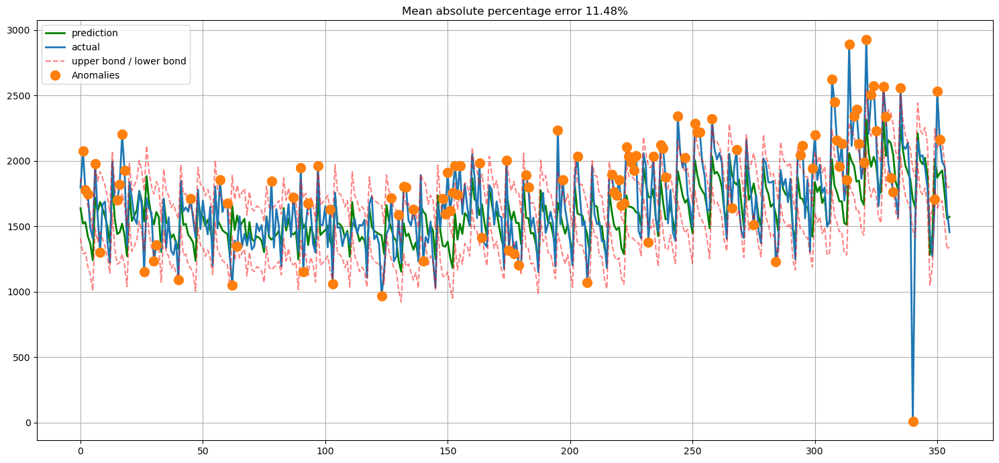

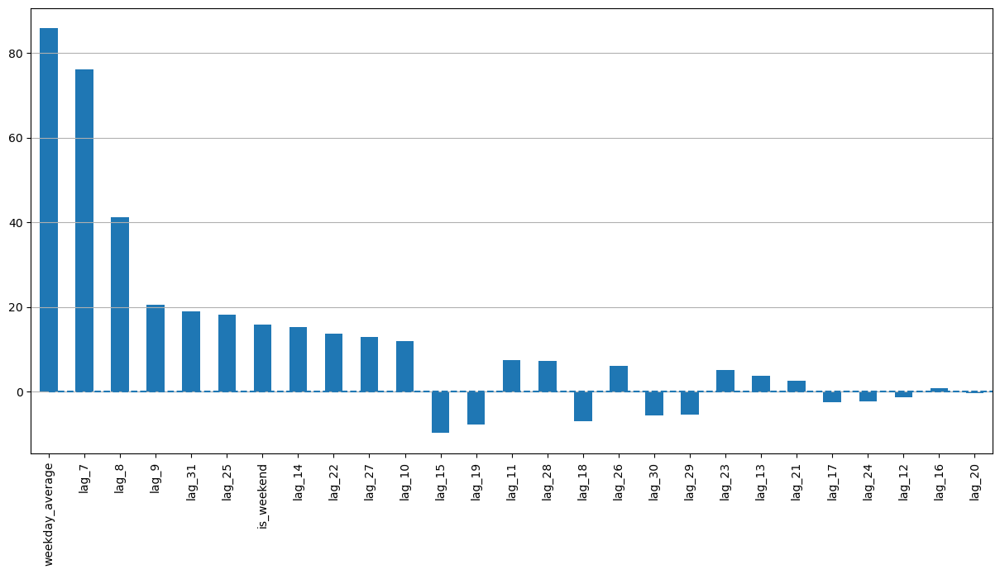

In [67]:
X_train, X_test, y_train, y_test = prepareData(df_daily.calls, lag_start=7, lag_end=32, test_size=0.3, target_encoding=True)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True, plot_anomalies=True)
plotCoefficients(lr)

In [68]:
X_train, X_test, y_train, y_test =\
prepareData(df_daily.calls, lag_start=7, lag_end=32, test_size=0.3, target_encoding=False)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

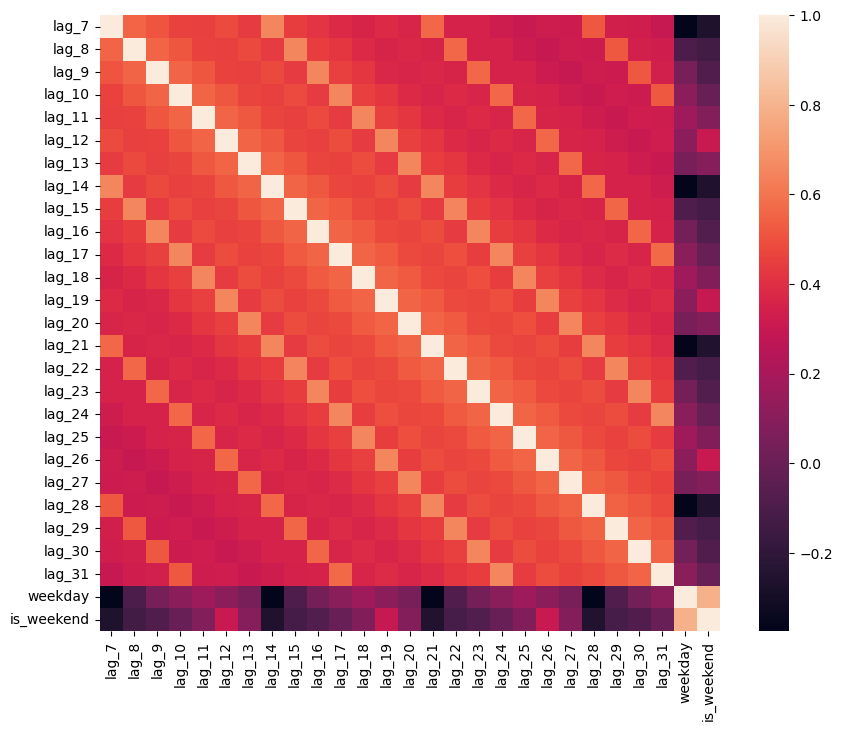

In [69]:
plt.figure(figsize=(10, 8))
sns.heatmap(X_train.corr());

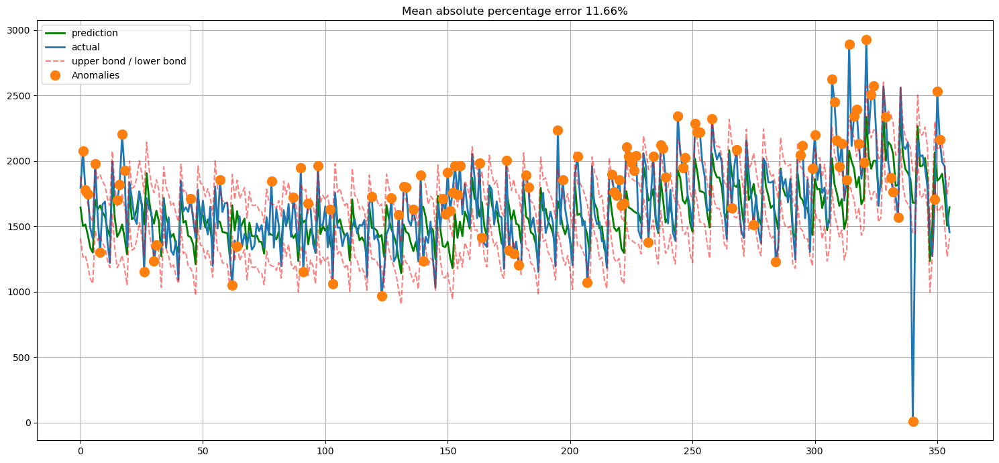

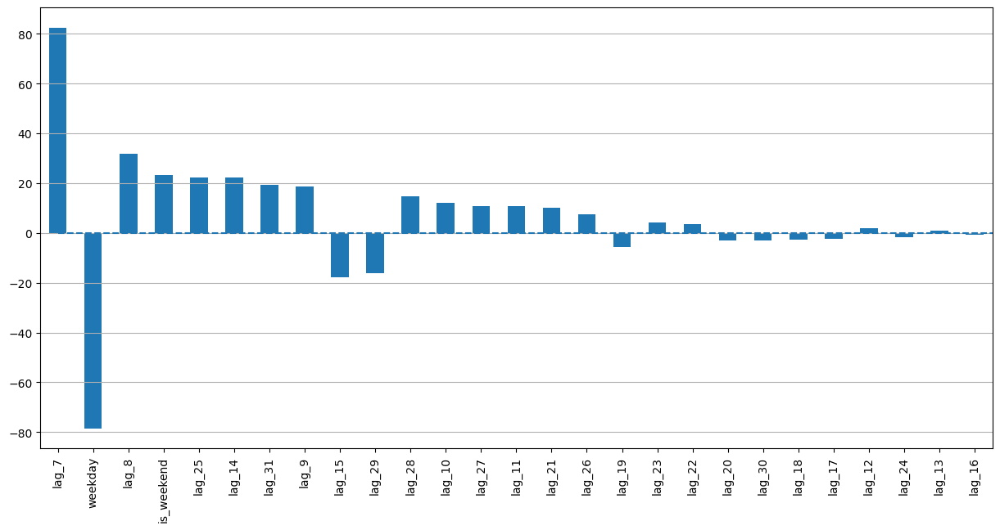

In [70]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=tscv)
ridge.fit(X_train_scaled, y_train)

plotModelResults(ridge, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(ridge)

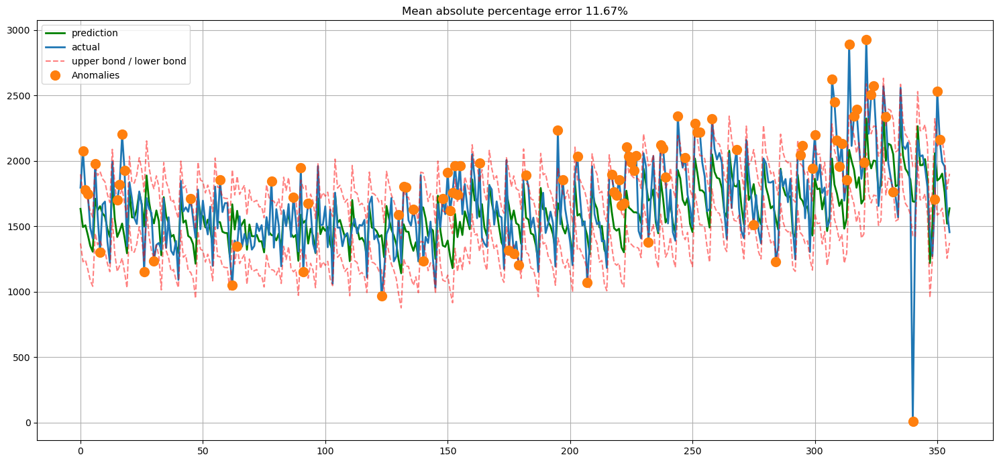

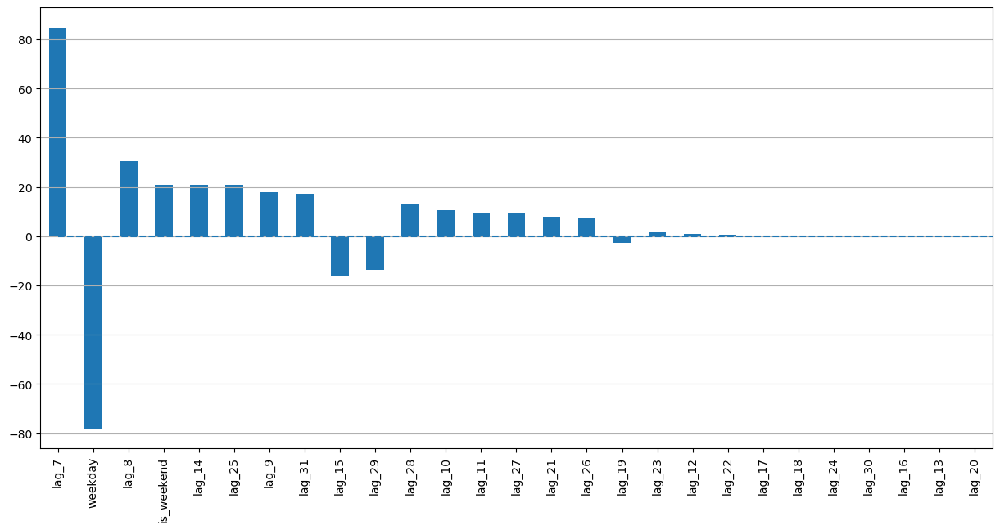

In [71]:
lasso = LassoCV(cv=tscv)
lasso.fit(X_train_scaled, y_train)

plotModelResults(lasso, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

# XGBoosting Machine

In [72]:
from xgboost import XGBRegressor 

xgb = XGBRegressor()
xgb.fit(X_train_scaled, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

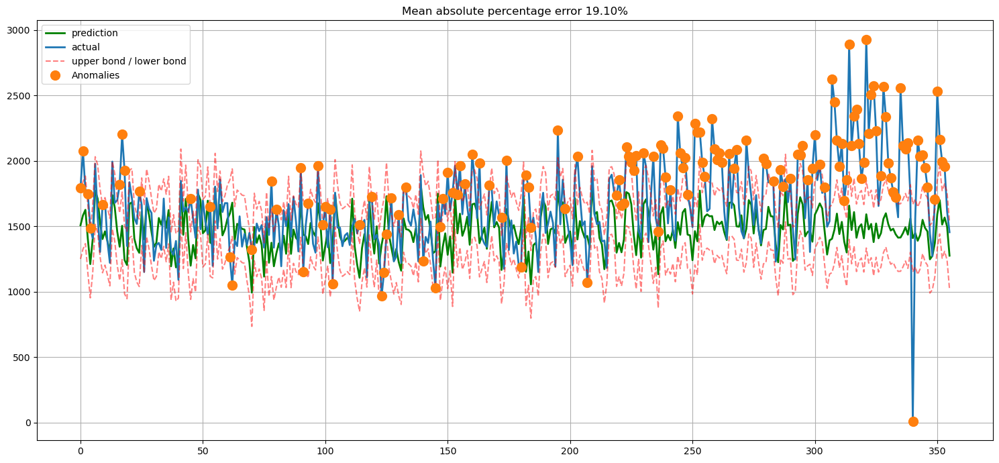

In [73]:
plotModelResults(xgb, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True, plot_anomalies=True)

# Calls per Hour Using Prophet for Forecasting
https://www.kaggle.com/code/robikscube/time-series-forecasting-with-prophet?scriptVersionId=26595661

In [74]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error
plt.style.use('fivethirtyeight') # For plots

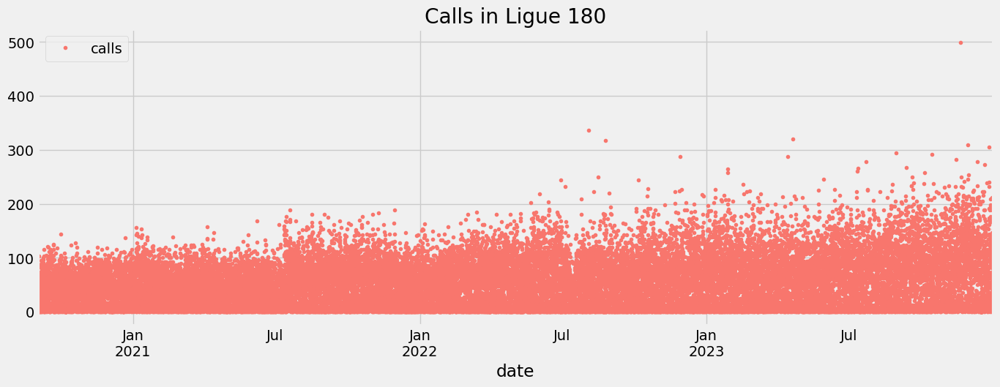

In [75]:
# Color pallete for plotting
color_pal = ["#F8766D", "#D39200", "#93AA00",
             "#00BA38", "#00C19F", "#00B9E3",
             "#619CFF", "#DB72FB"]
df_hourly.plot(style='.', figsize=(15,5), color=color_pal[0], title='Calls in Ligue 180')
plt.show()

## EDA

In [76]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
#    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth']]
    if label:
        y = df[label]
        return X, y
    return X

X, y = create_features(df_hourly, label="calls")

features_and_target = pd.concat([X, y], axis=1)

In [77]:
features_and_target.head()

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,calls
date,,,,,,,,
2020-09-02 00:00:00,0,2,3,9,2020,246,2,17
2020-09-02 01:00:00,1,2,3,9,2020,246,2,7
2020-09-02 02:00:00,2,2,3,9,2020,246,2,3
2020-09-02 03:00:00,3,2,3,9,2020,246,2,0
2020-09-02 04:00:00,4,2,3,9,2020,246,2,1


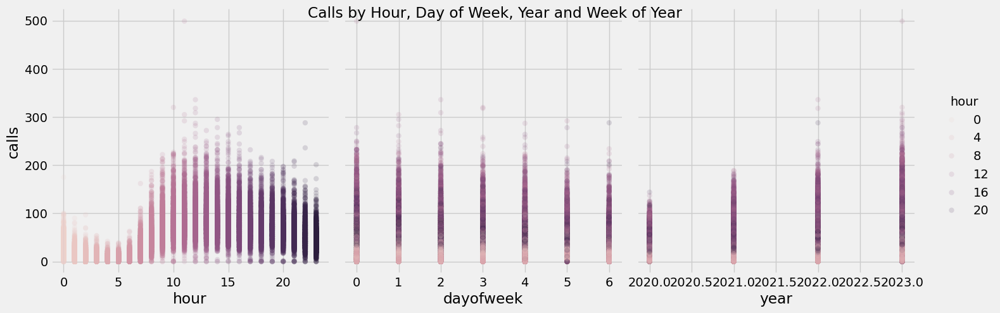

In [78]:
sns.pairplot(features_and_target.dropna(),
             hue='hour',
             x_vars=['hour','dayofweek',
                     'year'],
             y_vars='calls',
             height=5,
             plot_kws={'alpha':0.15, 'linewidth':0}
            )
plt.suptitle('Calls by Hour, Day of Week, Year and Week of Year')
plt.show()

In [79]:
split_date = '01-Jul-2023'
df_hourly_train = df_hourly.loc[df_hourly.index <= split_date].copy()
df_hourly_test = df_hourly.loc[df_hourly.index > split_date].copy()

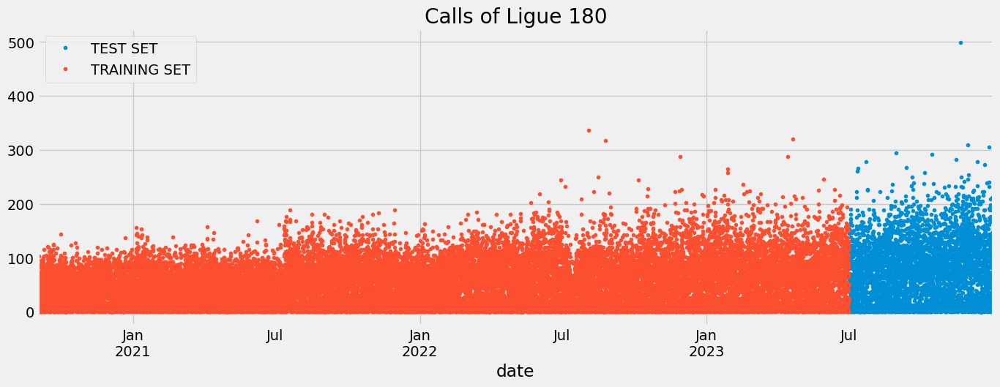

In [80]:
# Plot train and test so you can see where we have split
df_hourly_test \
    .rename(columns={'calls': 'TEST SET'}) \
    .join(df_hourly_train.rename(columns={'calls': 'TRAINING SET'}),
          how='outer') \
    .plot(figsize=(15,5), title='Calls of Ligue 180', style='.')
plt.show()



In [81]:
# Format data for prophet model using ds and y
df_hourly_train.reset_index() \
    .rename(columns={'date':'ds',
                     'calls':'y'}).head()

,ds,y
0,2020-09-02 00:00:00,17
1,2020-09-02 01:00:00,7
2,2020-09-02 02:00:00,3
3,2020-09-02 03:00:00,0
4,2020-09-02 04:00:00,1


In [82]:
# Setup and train model and fit
model = Prophet()
model.fit(df_hourly_train.reset_index() \
              .rename(columns={'date':'ds',
                               'calls':'y'}))

10:26:33 - cmdstanpy - INFO - Chain [1] start processing
10:26:46 - cmdstanpy - INFO - Chain [1] done processing


In [83]:
# Predict on training set with model
df_hourly_test_fcst = model.predict(df=df_hourly_test.reset_index() \
                                   .rename(columns={'date':'ds'}))

In [84]:
df_hourly_test_fcst.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2023-07-01 01:00:00,70.512609,-0.601444,60.307806,70.512609,70.512609,-39.852791,-39.852791,-39.852791,-35.111663,...,0.282339,0.282339,0.282339,-5.023467,-5.023467,-5.023467,0.0,0.0,0.0,30.659817
1,2023-07-01 02:00:00,70.514963,-8.440789,53.736382,70.514963,70.514963,-46.944277,-46.944277,-46.944277,-42.147441,...,0.241662,0.241662,0.241662,-5.038497,-5.038497,-5.038497,0.0,0.0,0.0,23.570686
2,2023-07-01 03:00:00,70.517317,-12.535072,50.065704,70.517317,70.517317,-51.993646,-51.993646,-51.993646,-47.103099,...,0.162959,0.162959,0.162959,-5.053507,-5.053507,-5.053507,0.0,0.0,0.0,18.523671
3,2023-07-01 04:00:00,70.519672,-14.448187,47.784354,70.519672,70.519672,-55.386355,-55.386355,-55.386355,-50.363574,...,0.045715,0.045715,0.045715,-5.068496,-5.068496,-5.068496,0.0,0.0,0.0,15.133317
4,2023-07-01 05:00:00,70.522026,-18.087368,47.490488,70.522026,70.522026,-54.989468,-54.989468,-54.989468,-49.795934,...,-0.110071,-0.110071,-0.110071,-5.083463,-5.083463,-5.083463,0.0,0.0,0.0,15.532558


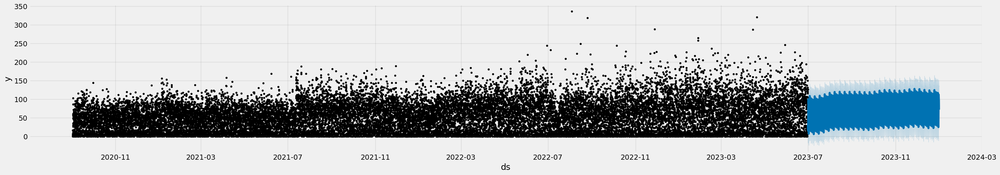

In [85]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(30)
fig = model.plot(df_hourly_test_fcst,
                 ax=ax)
plt.show()

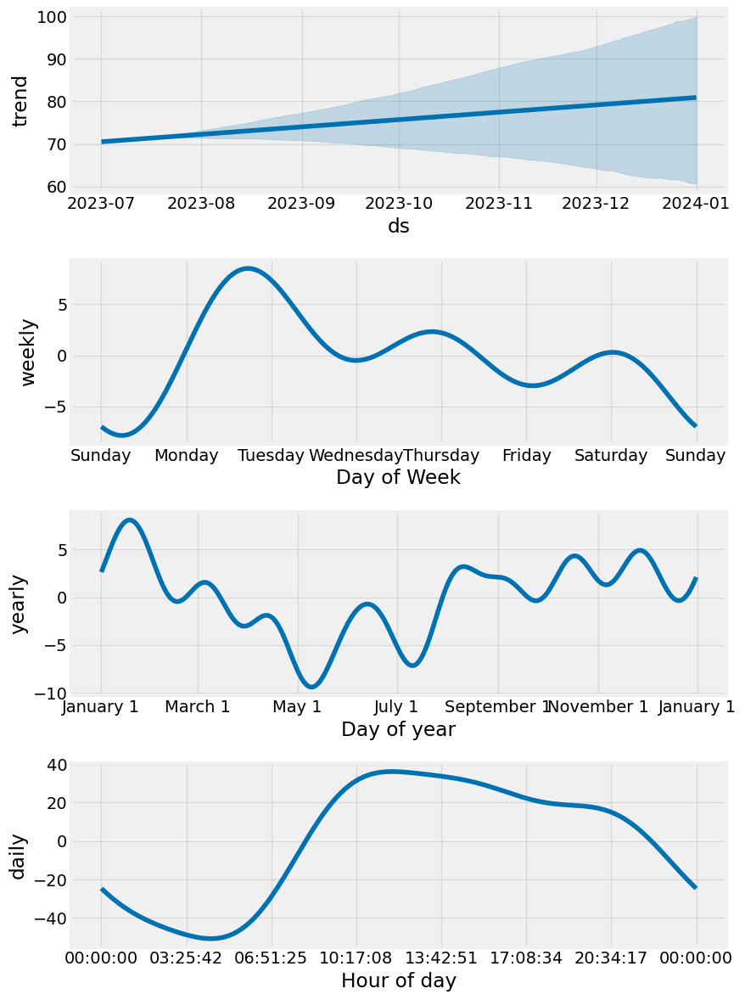

In [86]:
# Plot the components of the model
fig = model.plot_components(df_hourly_test_fcst)

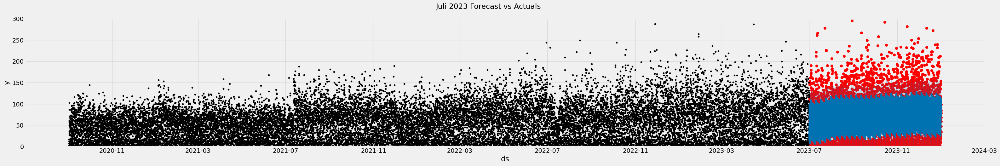

In [87]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(35)
ax.scatter(df_hourly_test.index, df_hourly_test['calls'], color='r')
fig = model.plot(df_hourly_test_fcst, ax=ax)
ax.set_ylim(0, 300)
plot = plt.suptitle('Juli 2023 Forecast vs Actuals')

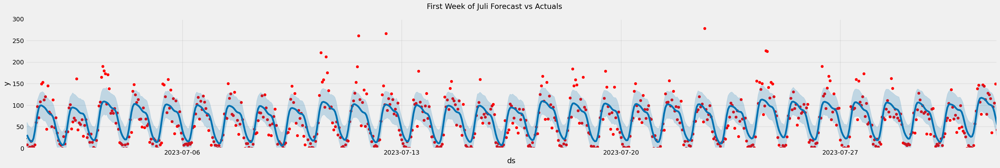

In [88]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(35)
ax.scatter(df_hourly_test.index, df_hourly_test['calls'], color='r')
fig = model.plot(df_hourly_test_fcst, ax=ax)
ax.set_xbound(lower=pd.Timestamp('07-01-2023'),
              upper=pd.Timestamp('08-01-2023'))
ax.set_ylim(0, 300)
plot = plt.suptitle('First Week of Juli Forecast vs Actuals')

## Error Metrics

In [89]:
mean_squared_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test_fcst['yhat'])

1321.4823286046976

In [90]:
mean_absolute_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test_fcst['yhat'])

27.83987370400089

In [91]:
df_hourly_test['calls']

date
2023-07-01 01:00:00     8
2023-07-01 02:00:00     0
2023-07-01 03:00:00     3
2023-07-01 04:00:00    16
2023-07-01 05:00:00     4
                       ..
2023-12-31 19:00:00    98
2023-12-31 20:00:00    84
2023-12-31 21:00:00    68
2023-12-31 22:00:00    34
2023-12-31 23:00:00    47
Name: calls, Length: 4415, dtype: int64

In [92]:
df_hourly_test_fcst['yhat']

0       30.659817
1       23.570686
2       18.523671
3       15.133317
4       15.532558
          ...    
4410    98.761597
4411    98.035192
4412    93.910593
4413    84.687470
4414    71.878168
Name: yhat, Length: 4415, dtype: float64

In [93]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    # Filtere die Nullwerte aus
    non_zero_indices = y_true != 0
    y_true = y_true[non_zero_indices]
    y_pred = y_pred[non_zero_indices]
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test_fcst['yhat'])


131.1937027526374

## Adding Holidays

In [94]:
import holidays
from datetime import date

In [95]:
br_holidays = holidays.BR()
br_holidays.get('2014-01-01')

'Confraternização Universal'

In [96]:
train_holidays = br_holidays[df_hourly_train.index.min():df_hourly_train.index.max()]
test_holidays = br_holidays[df_hourly_test.index.min():df_hourly_test.index.max()]

In [97]:
df_hourly = df_hourly.rename_axis('Datetime')
df_hourly_test = df_hourly_test.rename_axis('Datetime')
df_hourly_train = df_hourly_train.rename_axis('Datetime')

In [98]:
# Create a dataframe with holiday, ds columns
df_hourly['date'] = df_hourly.index.date
df_hourly['is_holiday'] = df_hourly['date'].isin(br_holidays)
holiday_df = df_hourly.loc[df_hourly['is_holiday']] \
    .reset_index() \
    .rename(columns={'Datetime':'ds'})
holiday_df['holiday'] = 'BrasilHoliday'
holiday_df = holiday_df.drop(['calls','date','is_holiday'], axis=1)
holiday_df.head()

,ds,holiday
0,2020-09-07 00:00:00,BrasilHoliday
1,2020-09-07 01:00:00,BrasilHoliday
2,2020-09-07 02:00:00,BrasilHoliday
3,2020-09-07 03:00:00,BrasilHoliday
4,2020-09-07 04:00:00,BrasilHoliday


In [99]:
holiday_df['ds'] = pd.to_datetime(holiday_df['ds'])

In [100]:
# Setup and train model with holidays
model_with_holidays = Prophet(holidays=holiday_df)
model_with_holidays.fit(df_hourly_train.reset_index() \
                            .rename(columns={'Datetime':'ds',
                                             'calls':'y'}))

10:26:56 - cmdstanpy - INFO - Chain [1] start processing
10:27:17 - cmdstanpy - INFO - Chain [1] done processing


In [101]:
# Predict on training set with model
df_hourly_test_fcst_with_hols = \
    model_with_holidays.predict(df=df_hourly_test.reset_index() \
                                    .rename(columns={'Datetime':'ds'}))

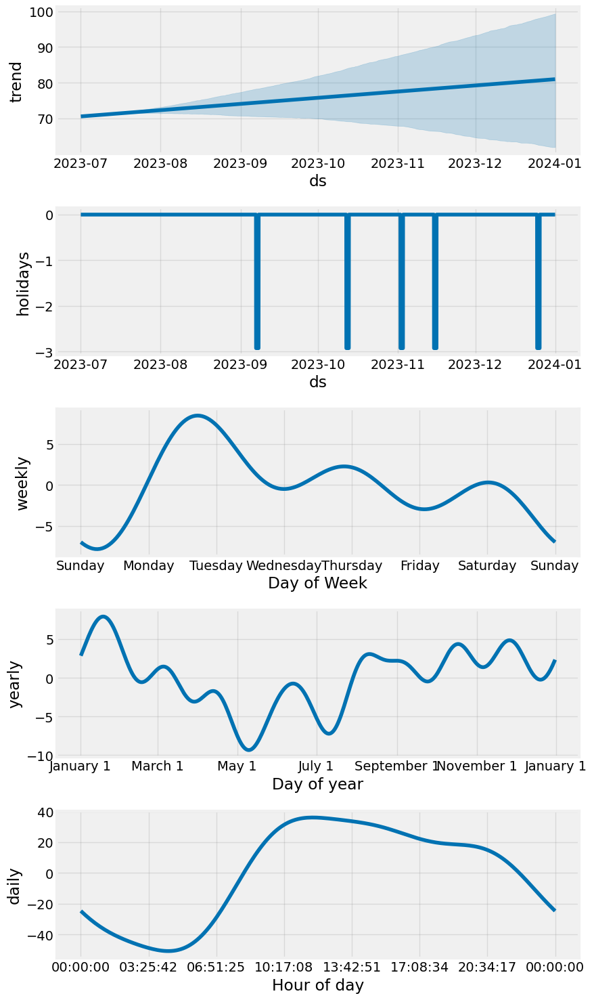

In [102]:
fig2 = model_with_holidays.plot_components(df_hourly_test_fcst_with_hols)

### Error Metrics with Holiday added

In [103]:
mean_squared_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test_fcst_with_hols['yhat'])

1320.4600113864335

In [104]:
mean_absolute_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test_fcst_with_hols['yhat'])

27.836391440396305

In [105]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    # Filtere die Nullwerte aus
    non_zero_indices = y_true != 0
    y_true = y_true[non_zero_indices]
    y_pred = y_pred[non_zero_indices]
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mean_absolute_percentage_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test_fcst_with_hols['yhat'])

131.22074573419286

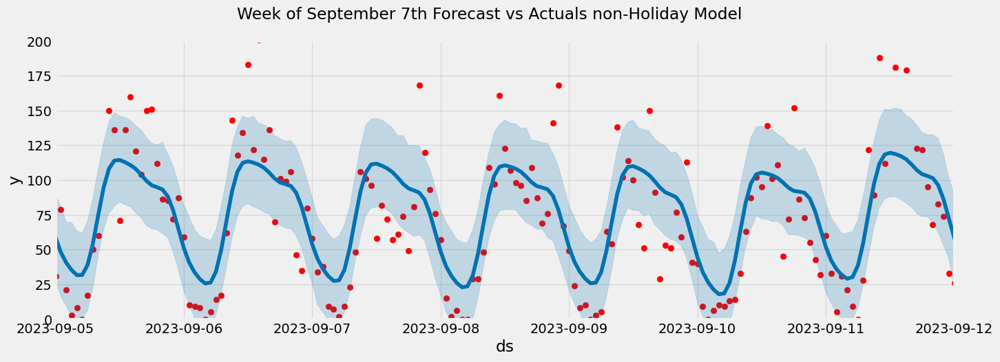

In [106]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_hourly_test.index, df_hourly_test['calls'], color='r')
fig = model.plot(df_hourly_test_fcst, ax=ax)
ax.set_xbound(lower=pd.Timestamp('09-05-2023'), upper=pd.Timestamp('09-12-2023'))
ax.set_ylim(0, 200)
plot = plt.suptitle('Week of September 7th Forecast vs Actuals non-Holiday Model')


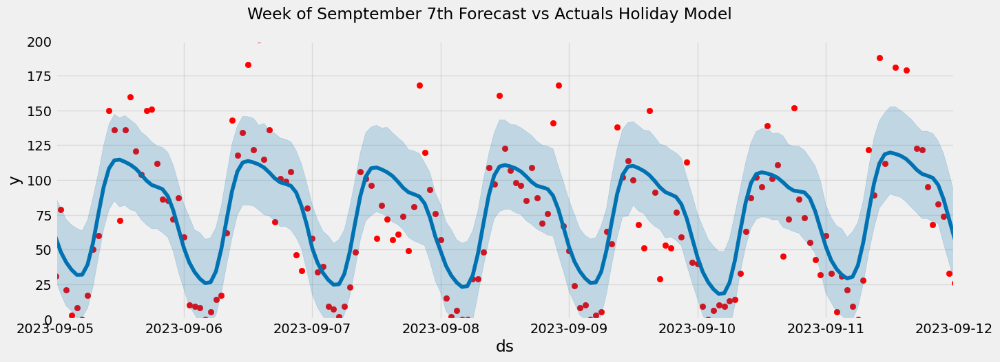

In [107]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(df_hourly_test.index, df_hourly_test['calls'], color='r')
fig = model.plot(df_hourly_test_fcst_with_hols, ax=ax)
ax.set_xbound(lower=pd.Timestamp('09-05-2023'), upper=pd.Timestamp('09-12-2023'))
ax.set_ylim(0, 200)
plot = plt.suptitle('Week of Semptember 7th Forecast vs Actuals Holiday Model')

In [108]:
df_hourly_test

,calls
Datetime,
2023-07-01 01:00:00,8
2023-07-01 02:00:00,0
2023-07-01 03:00:00,3
2023-07-01 04:00:00,16
2023-07-01 05:00:00,4
...,...
2023-12-31 19:00:00,98
2023-12-31 20:00:00,84
2023-12-31 21:00:00,68


In [109]:
jul4_test = df_hourly_test.query('Datetime == "2023-09-07"')
jul4_pred = df_hourly_test_fcst.query('ds == "2023-09-07"')
jul4_pred_holiday_model = df_hourly_test_fcst_with_hols.query('ds == "2023-09-07"')
jul4_test

,calls
Datetime,
2023-09-07,58


In [110]:
mean_absolute_error(y_true=jul4_test['calls'],
                   y_pred=jul4_pred['yhat'])

4.258172909517597

In [111]:
mean_absolute_error(y_true=jul4_test['calls'],
                   y_pred=jul4_pred_holiday_model['yhat'])

7.017287749441735

In [112]:
holiday_list = holiday_df['ds'].tolist()

In [113]:
hols_test = df_hourly_test.query('Datetime in @holiday_list')
hols_pred = df_hourly_test_fcst.query('ds in @holiday_list')
hols_pred_holiday_model = df_hourly_test_fcst_with_hols.query('ds in @holiday_list')

In [114]:
mean_absolute_error(y_true=hols_test['calls'],
                   y_pred=hols_pred['yhat'])

27.11584252324698

In [115]:
mean_absolute_error(y_true=hols_test['calls'],
                   y_pred=hols_pred_holiday_model['yhat'])

26.22205750168388

In [116]:
holiday_df['date'] = holiday_df['ds'].dt.date

for hol, d in holiday_df.groupby('date'):
    holiday_list = d['ds'].tolist()
    hols_test = df_hourly_test.query('Datetime in @holiday_list')
    if len(hols_test) == 0:
        continue
    hols_pred = df_hourly_test_fcst.query('ds in @holiday_list')
    hols_pred_holiday_model = df_hourly_test_fcst_with_hols.query('ds in @holiday_list')
    non_hol_error = mean_absolute_error(y_true=hols_test['calls'],
                   y_pred=hols_pred['yhat'])
    hol_model_error = mean_absolute_error(y_true=hols_test['calls'],
                       y_pred=hols_pred_holiday_model['yhat'])
    diff = non_hol_error - hol_model_error
    print(f'Holiday: {hol:%B %d, %Y}:    \n MAE (non-holiday model): {non_hol_error:0.1f} \n MAE (Holiday Model): {hol_model_error:0.1f} \n Diff {diff:0.1f}')

Holiday: September 07, 2023:    
 MAE (non-holiday model): 26.0 
 MAE (Holiday Model): 24.9 
 Diff 1.2
Holiday: October 12, 2023:    
 MAE (non-holiday model): 25.8 
 MAE (Holiday Model): 24.6 
 Diff 1.2
Holiday: November 02, 2023:    
 MAE (non-holiday model): 29.5 
 MAE (Holiday Model): 28.1 
 Diff 1.4
Holiday: November 15, 2023:    
 MAE (non-holiday model): 29.3 
 MAE (Holiday Model): 29.8 
 Diff -0.5
Holiday: December 25, 2023:    
 MAE (non-holiday model): 24.9 
 MAE (Holiday Model): 23.7 
 Diff 1.2


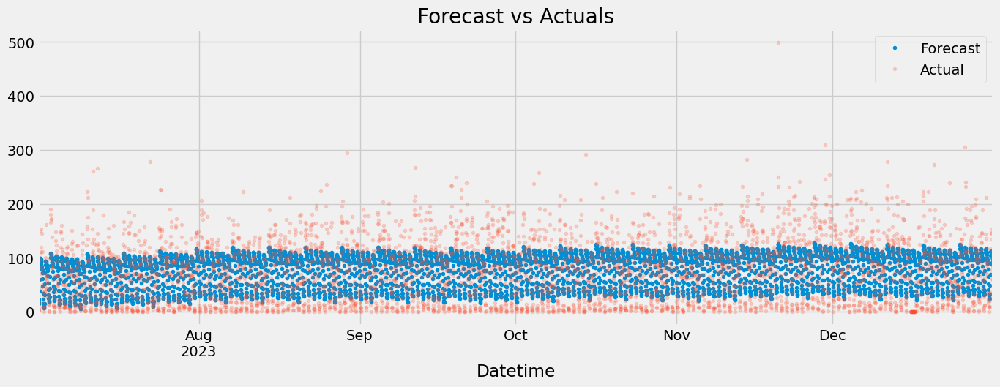

In [117]:
ax = df_hourly_test_fcst.set_index('ds')['yhat'].plot(figsize=(15, 5),
                                                 lw=0,
                                                 style='.')
df_hourly_test['calls'].plot(ax=ax,
                          style='.',
                          lw=0,
                          alpha=0.2)
plt.legend(['Forecast','Actual'])
plt.title('Forecast vs Actuals')
plt.show()

## Data Cleaning

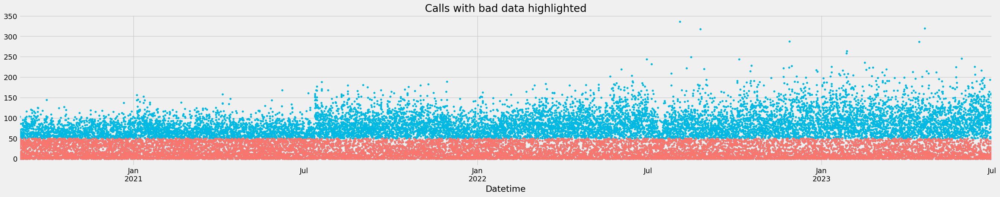

In [118]:
ax = df_hourly_train.plot(style='.',
                     figsize=(15,5),
                     color=color_pal[5],
                     title='Calls with bad data highlighted',
                     xlim=(pd.Timestamp('01-01-2021'),pd.Timestamp('01-01-2022'))
                    )
df_hourly_train.query('calls < 50').plot(style='.',
                                             figsize=(30,5),
                                             color=color_pal[0],
                                             ax=ax)
ax.legend().set_visible(False)
plt.show()

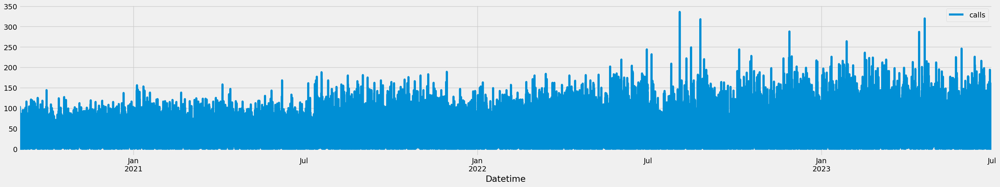

In [119]:
df_hourly_train.plot(figsize=(30, 5))
plt.show()

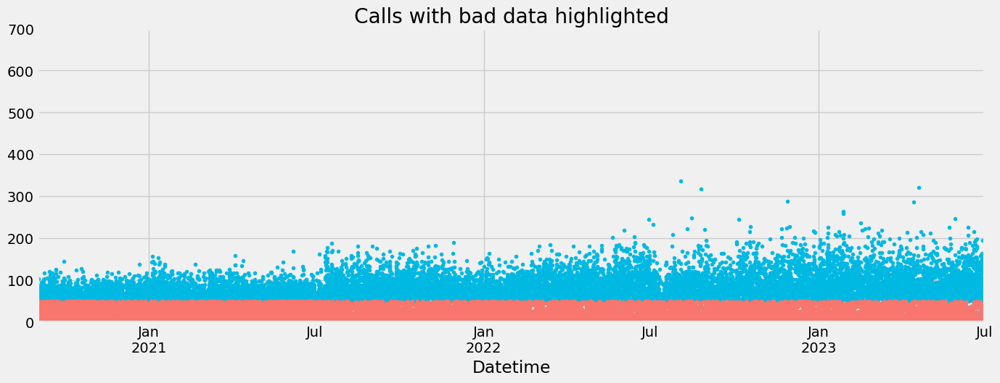

In [120]:
ax = df_hourly_train.plot(style='.',
                     figsize=(15,5),
                     color=color_pal[5],
                     title='Calls with bad data highlighted',
                     xlim=(pd.Timestamp('10-29-2021'), pd.Timestamp('11-01-2021')),
                     ylim=(0, 700)
                    )
df_hourly_train.query('calls < 50').plot(style='.',
                                             figsize=(15,5),
                                             color=color_pal[0],
                                             ax=ax)
ax.legend().set_visible(False)
plt.show()

In [121]:
# Clean Data
df_hourly_train['calls_clean'] = df_hourly_train['calls']
df_hourly_train.loc[df_hourly_train['calls'] < 50, 'calls_clean'] = np.nan

# Überprüfe die Spaltennamen
print(df_hourly_train.columns)

# Train model on clean data
model = Prophet()
df_train_clean = df_hourly_train.reset_index().rename(columns={'date': 'ds', 'calls_clean': 'y'})
print(df_train_clean.columns)  # Überprüfe die Spaltennamen nach dem Umbenennen

model.fit(df_train_clean)

# Predict on training set with clean model
df_test_clean = df_hourly_test.reset_index().rename(columns={'date': 'ds'})
df_hourly_test_fcst_clean = model.predict(df_test_clean)

print(df_hourly_test_fcst_clean.head())  # Überprüfe die ersten paar Zeilen der Vorhersagen

Index(['calls', 'calls_clean'], dtype='object')
Index(['Datetime', 'calls', 'y'], dtype='object')


ValueError: Dataframe must have columns "ds" and "y" with the dates and values respectively.

In [ ]:
mse_clean = mean_squared_error(y_true=df_hourly_test['calls'],
                               y_pred=df_hourly_test_fcst_clean['yhat']
                              )
mae_clean = mean_absolute_error(y_true=df_hourly_test['calls'],
                                y_pred=df_hourly_test_fcst_clean['yhat']
                               )
mape_clean = mean_absolute_percentage_error(y_true=df_hourly_test['calls'],
                                            y_pred=df_hourly_test_fcst_clean['yhat'])
print(f'Cleaned data model has MSE {mse_clean:0.4f} - MAE {mae_clean:0.4f} - MAPE {mape_clean:0.4f}')

Cleaned data model has MSE 2166.0075 - MAE 39.0994 - MAPE 276.0864


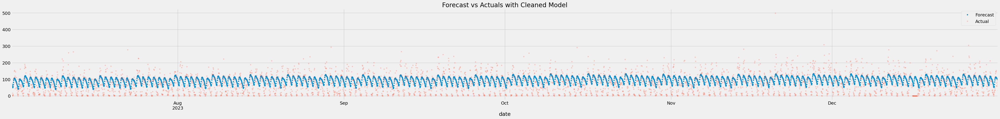

In [ ]:
ax = df_hourly_test_fcst_clean.set_index('ds')['yhat'] \
    .plot(figsize=(50, 5), lw=0, style='.')
df_hourly_test['calls'].plot(ax=ax, style='.', lw=0, alpha=0.2)
plt.legend(['Forecast','Actual'])
plt.title('Forecast vs Actuals with Cleaned Model')
plt.show()

# Hourly Time Series Forecasting using XGBoost
https://www.kaggle.com/code/robikscube/tutorial-time-series-forecasting-with-xgboost

In [ ]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error
plt.style.use('fivethirtyeight')

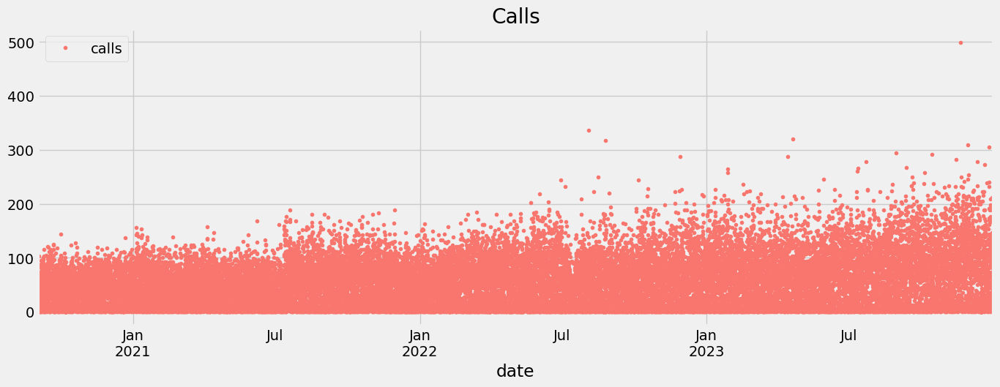

In [ ]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = df_hourly.plot(style='.', figsize=(15,5), color=color_pal[0], title='Calls')

In [ ]:
split_date = '01-Jul-2023'
df_hourly_train = df_hourly.loc[df_hourly.index <= split_date].copy()
df_hourly_test = df_hourly.loc[df_hourly.index > split_date].copy()

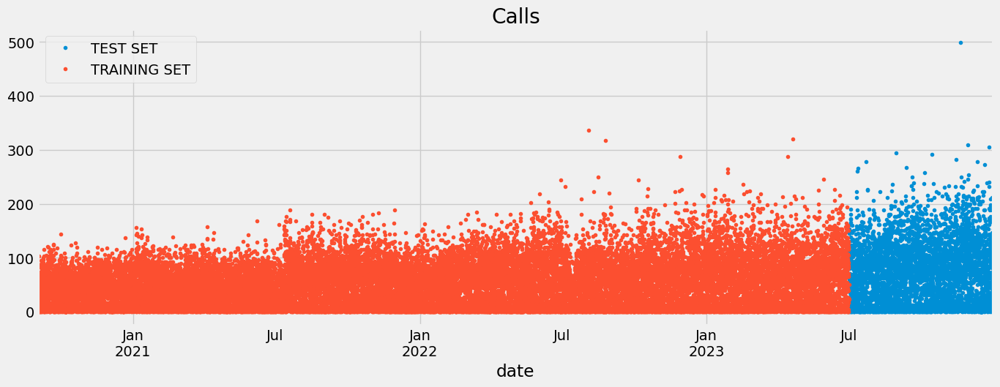

In [ ]:
_ = df_hourly_test \
    .rename(columns={'calls': 'TEST SET'}) \
    .join(df_hourly_train.rename(columns={'calls': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Calls', style='.')

In [ ]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth']]
    if label:
        y = df[label]
        return X, y
    return X

In [ ]:
X_train, y_train = create_features(df_hourly_train, label='calls')
X_test, y_test = create_features(df_hourly_test, label='calls')

In [ ]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

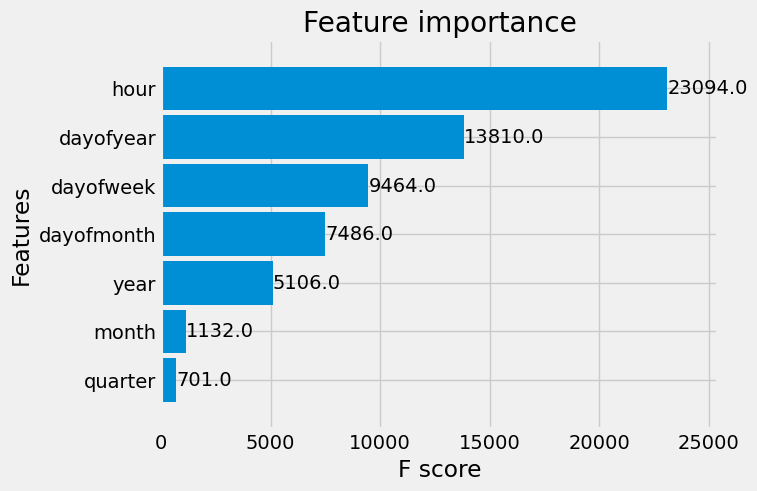

In [ ]:
_ = plot_importance(reg, height=0.9)

## Forecast on Test Set

In [ ]:
df_hourly_test['calls_prediction'] = reg.predict(X_test)
df_hourly_all = pd.concat([df_hourly_test, df_hourly_train], sort=False)

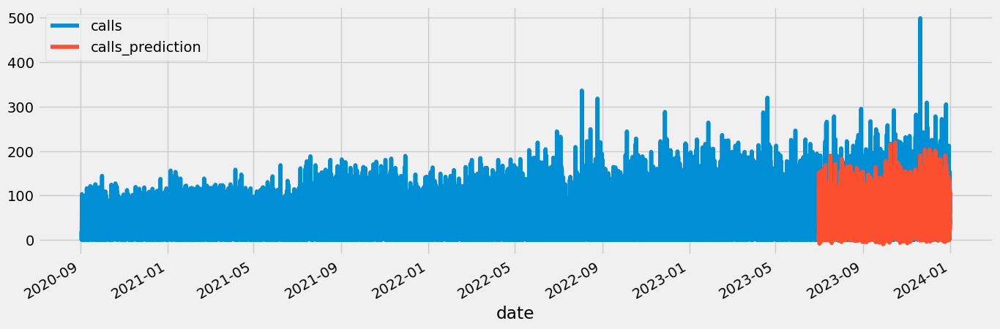

In [ ]:
_ = df_hourly_all[['calls','calls_prediction']].plot(figsize=(15, 5))

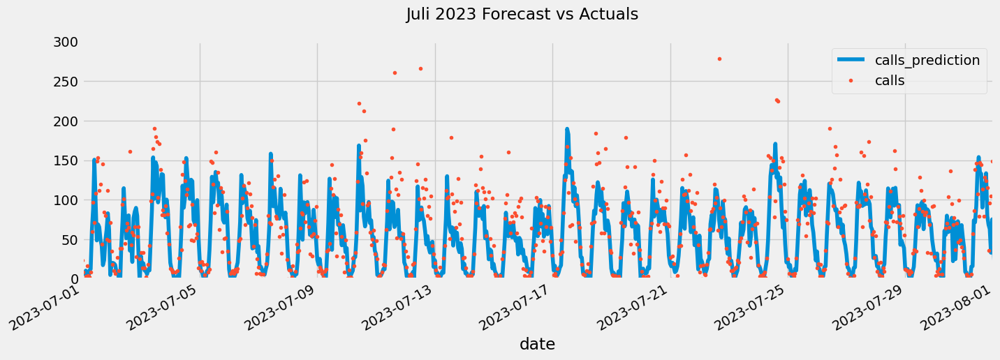

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower=pd.Timestamp('07-01-2023'), upper=pd.Timestamp('08-01-2023'))
ax.set_ylim(0, 300)
plot = plt.suptitle('Juli 2023 Forecast vs Actuals')

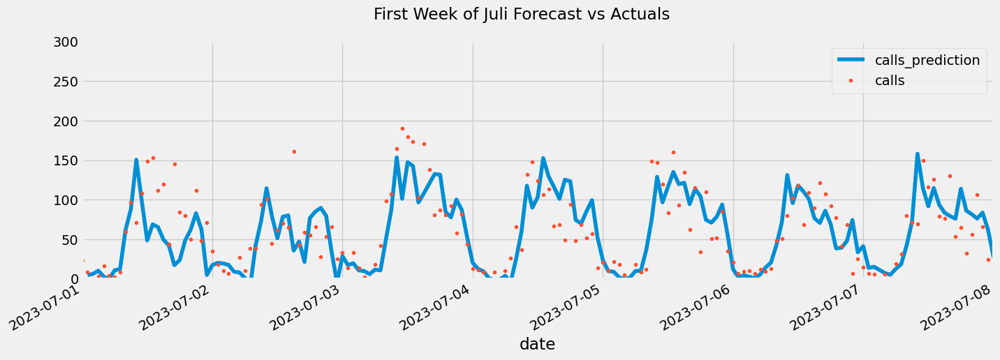

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower=pd.Timestamp('07-01-2023'), upper=pd.Timestamp('07-08-2023'))
ax.set_ylim(0, 300)
plot = plt.suptitle('First Week of Juli Forecast vs Actuals')

## Error Metrics On Test Set

In [ ]:
mean_squared_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test['calls_prediction'])

1644.7174490591856

In [ ]:
mean_absolute_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test['calls_prediction'])

28.347483515886047

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    # Filter out zero values in y_true
    non_zero_indices = y_true != 0
    y_true = y_true[non_zero_indices]
    y_pred = y_pred[non_zero_indices]
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
mean_absolute_percentage_error(y_true=df_hourly_test['calls'],
                   y_pred=df_hourly_test['calls_prediction'])

57.558570261481165

In [ ]:
df_hourly_test['error'] = df_hourly_test['calls'] - df_hourly_test['calls_prediction']
df_hourly_test['abs_error'] = df_hourly_test['error'].apply(np.abs)
error_by_day = df_hourly_test.groupby(['year','month','dayofmonth']) \
    .mean()[['calls','calls_prediction','error','abs_error']]

In [ ]:
# Over forecasted days
error_by_day.sort_values('error', ascending=True).head(10)

calls  calls_prediction      error  abs_error
year month dayofmonth                                                   
2023 12    16           0.458333         67.750450 -67.292117  67.292117
           10          65.375000         78.642288 -13.267286  26.924007
     8     11          57.708333         68.832977 -11.124645  18.295460
     10    21          51.250000         62.050476 -10.800476  33.280094
     8     5           44.541667         55.221027 -10.679360  20.763881
     7     17          67.833333         78.104713 -10.271378  21.183860
           4           54.958333         65.155113 -10.196780  25.336764
     8     9           63.125000         72.559837  -9.434840  25.073930
     11    4           54.333333         62.568268  -8.234935  25.823697
     8     10          63.916667         71.834549  -7.917882  18.539452

In [ ]:
# Worst absolute predicted days
error_by_day.sort_values('abs_error', ascending=False).head(10)

calls  calls_prediction      error  abs_error
year month dayofmonth                                                    
2023 12    16            0.458333         67.750450 -67.292117  67.292117
     11    20          120.375000         73.480995  46.894008  55.334717
           13          109.333333         74.379593  34.953740  47.423303
           27          121.958333         77.047951  44.910386  45.542776
     12    26          105.541667         71.774094  33.767573  44.529248
     11    23           99.750000         57.379456  42.370545  42.574173
           5            80.833333         44.449783  36.383549  42.445115
           29          104.458333         70.890549  33.567784  42.115613
     12    4           107.041667         72.619637  34.422027  41.538193
           20           85.083333         66.970650  18.112684  40.458471

In [ ]:
# Best predicted days
error_by_day.sort_values('abs_error', ascending=True).head(10)

calls  calls_prediction     error  abs_error
year month dayofmonth                                                  
2023 8     27          58.666667         58.052444  0.614223  15.288844
           3           62.750000         54.640987  8.109015  15.566254
           16          73.375000         66.348610  7.026392  15.673043
     10    11          72.125000         63.831661  8.293339  17.025649
     11    12          64.125000         64.960304 -0.835300  17.229489
     8     12          57.958333         58.294586 -0.336254  17.418323
     7     23          49.708333         47.956879  1.751455  17.519424
           6           53.833333         52.764378  1.068953  17.924129
     8     13          49.250000         49.877258 -0.627261  18.054733
           7           81.625000         78.809418  2.815582  18.090764

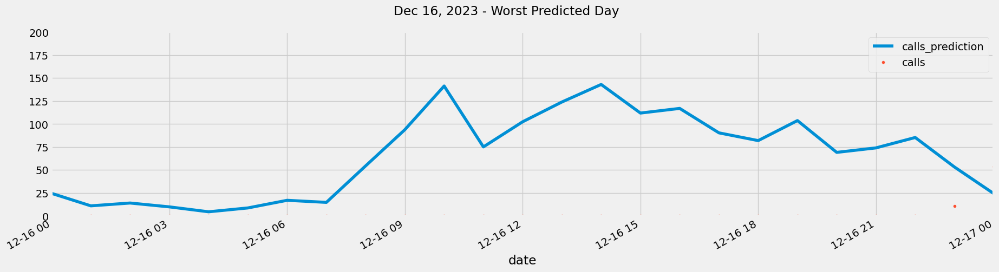

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 200)
ax.set_xbound(lower=pd.Timestamp('12-16-2023'), upper=pd.Timestamp('12-17-2023'))
plot = plt.suptitle('Dec 16, 2023 - Worst Predicted Day')

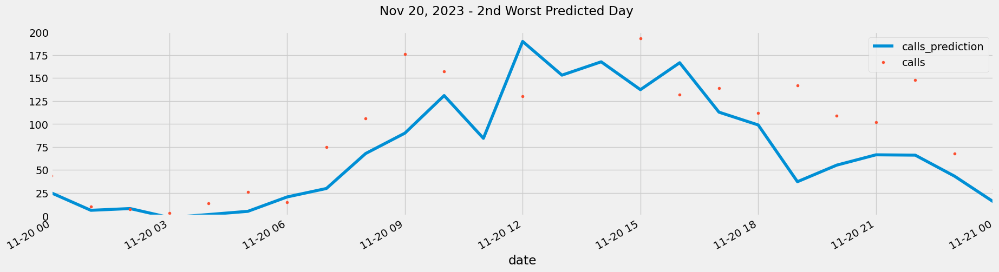

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 200)
ax.set_xbound(lower=pd.Timestamp('11-20-2023'), upper=pd.Timestamp('11-21-2023'))
plot = plt.suptitle('Nov 20, 2023 - 2nd Worst Predicted Day')

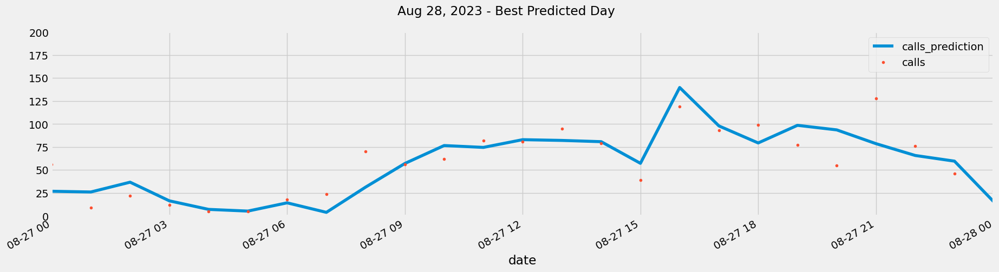

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 200)
ax.set_xbound(lower=pd.Timestamp('08-27-2023'), upper=pd.Timestamp('08-28-2023'))
plot = plt.suptitle('Aug 28, 2023 - Best Predicted Day')

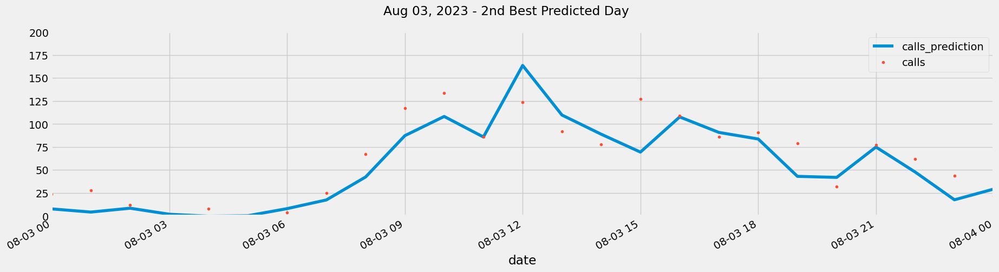

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
_ = df_hourly_all[['calls_prediction','calls']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 200)
ax.set_xbound(lower=pd.Timestamp('08-03-2023'), upper=pd.Timestamp('08-04-2023'))
plot = plt.suptitle('Aug 03, 2023 - 2nd Best Predicted Day')